# ML Data Cleaning and Feature Selection

## Author: 
- Yash Pankhania (pankhania.y@northeastern.edu)

Github Repository URL: https://github.com/Draconian10/Australia_Weather_Prediction

## Abstract
In this notebook, the Australia weather data underwent data cleaning and feature selection before being analyzed using Logistic Regression. The aim was to determine the impact of various predictor variables on the target variable. The results showed high accuracy in predicting rain for tomorrow based on the predictor variables and highlighted the significant predictors. Logistic Regression was found to be an effective tool in analyzing the relationship between the predictor variables and target variable in the Australia weather data.


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
%matplotlib inline
warnings.filterwarnings("ignore")

In [2]:
# Reading data from the CSV file and inserting it into a DataFrame
train_df = pd.read_csv('https://raw.githubusercontent.com/Draconian10/Australia_Weather_Prediction/main/Data_Cleaning_Feature_Selection/Weather%20Training%20Data.csv')

In [3]:
# Displaying data in the DataFrame
train_df.head()

,row ID,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Row0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Row1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Row2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Row3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Row4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


In [4]:
# Fetching number of rows and columns
train_df.shape

(99516, 23)

In [5]:
# Fetching data types of each individual columns
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99516 entries, 0 to 99515
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   row ID         99516 non-null  object 
 1   Location       99516 non-null  object 
 2   MinTemp        99073 non-null  float64
 3   MaxTemp        99286 non-null  float64
 4   Rainfall       98537 non-null  float64
 5   Evaporation    56985 non-null  float64
 6   Sunshine       52199 non-null  float64
 7   WindGustDir    92995 non-null  object 
 8   WindGustSpeed  93036 non-null  float64
 9   WindDir9am     92510 non-null  object 
 10  WindDir3pm     96868 non-null  object 
 11  WindSpeed9am   98581 non-null  float64
 12  WindSpeed3pm   97681 non-null  float64
 13  Humidity9am    98283 non-null  float64
 14  Humidity3pm    97010 non-null  float64
 15  Pressure9am    89768 non-null  float64
 16  Pressure3pm    89780 non-null  float64
 17  Cloud9am       61944 non-null  float64
 18  Cloud3

In [6]:
# Fetching unique values in each column
train_df.nunique()

row ID           99516
Location            49
MinTemp            386
MaxTemp            500
Rainfall           601
Evaporation        327
Sunshine           145
WindGustDir         16
WindGustSpeed       67
WindDir9am          16
WindDir3pm          16
WindSpeed9am        43
WindSpeed3pm        44
Humidity9am        101
Humidity3pm        101
Pressure9am        536
Pressure3pm        536
Cloud9am            10
Cloud3pm            10
Temp9am            432
Temp3pm            491
RainToday            2
RainTomorrow         2
dtype: int64

In [7]:
# Fetching a descriptive statistics summary of the DataFrame
train_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
count,99073.000000,99286.000000,98537.000000,56985.00000,52199.000000,93036.000000,98581.000000,97681.000000,98283.000000,97010.000000,89768.000000,89780.000000,61944.000000,59514.000000,98902.000000,97612.000000,99516.000000
mean,12.176266,23.218513,2.353024,5.46132,7.615090,39.976966,14.004849,18.650464,68.866376,51.433296,1017.684638,1015.286204,4.447985,4.519122,16.970041,21.681340,0.224677
std,6.390882,7.115072,8.487866,4.16249,3.783008,13.581524,8.902323,8.801827,19.074951,20.777616,7.110166,7.045189,2.886580,2.716618,6.488961,6.931681,0.417372
min,-8.500000,-4.100000,0.000000,0.00000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,978.200000,0.000000,0.000000,-7.000000,-5.100000,0.000000
25%,7.600000,17.900000,0.000000,2.60000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.500000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,12.000000,22.600000,0.000000,4.80000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.700000,1015.300000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,16.800000,28.200000,0.800000,7.40000,10.600000,48.000000,19.000000,24.000000,83.000000,65.000000,1022.400000,1020.000000,7.000000,7.000000,21.500000,26.400000,0.000000
max,33.900000,48.100000,371.000000,86.20000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,1.000000


In [8]:
# Dropping unwanted columns from the DataFrame
train_df.drop(columns='row ID', inplace=True)
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


In [9]:
# Searching for NULL values in the DataFrame
train_df.isnull().sum()

Location             0
MinTemp            443
MaxTemp            230
Rainfall           979
Evaporation      42531
Sunshine         47317
WindGustDir       6521
WindGustSpeed     6480
WindDir9am        7006
WindDir3pm        2648
WindSpeed9am       935
WindSpeed3pm      1835
Humidity9am       1233
Humidity3pm       2506
Pressure9am       9748
Pressure3pm       9736
Cloud9am         37572
Cloud3pm         40002
Temp9am            614
Temp3pm           1904
RainToday          979
RainTomorrow         0
dtype: int64

In [10]:
# Replacing the string value 'NA' with NaN in the DataFrame
train_df['RainToday'] = train_df['RainToday'].replace('NA', np.nan)

In [11]:
# Displaying data in the DataFrame
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


## Data Visualization

### QQ Plot
A Q-Q (Quantile-Quantile) plot is a graphical representation of the distribution of two datasets, usually the observed and expected (theoretical) distributions. It is used to assess whether a set of data follows a specified theoretical distribution, such as a normal distribution.

In a Q-Q plot, the quantiles of the two datasets are plotted against each other. If the observed data follows the theoretical distribution, the points on the plot will approximately lie on a straight line. Deviations from a straight line indicate that the observed data deviates from the specified theoretical distribution.

Refer: https://www.statsmodels.org/dev/generated/statsmodels.graphics.gofplots.qqplot.html

<Figure size 576x360 with 0 Axes>

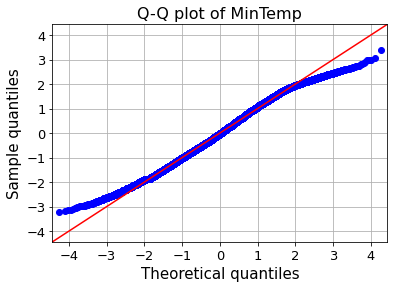

<Figure size 576x360 with 0 Axes>

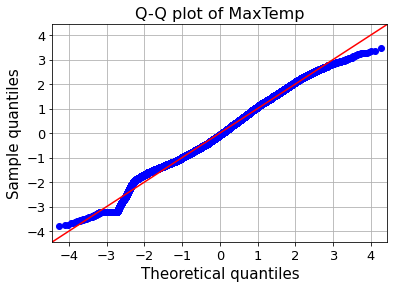

<Figure size 576x360 with 0 Axes>

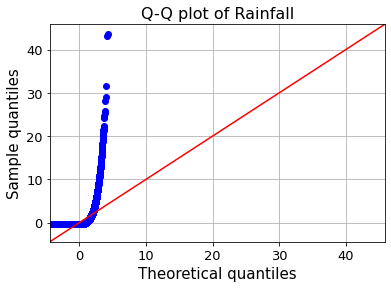

<Figure size 576x360 with 0 Axes>

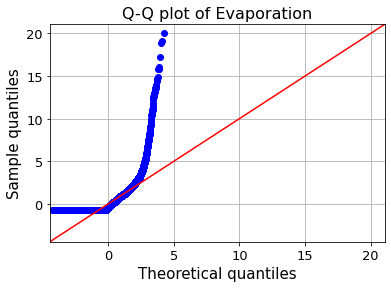

<Figure size 576x360 with 0 Axes>

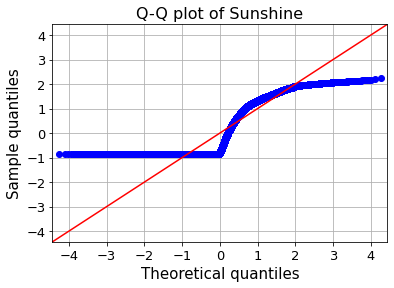

<Figure size 576x360 with 0 Axes>

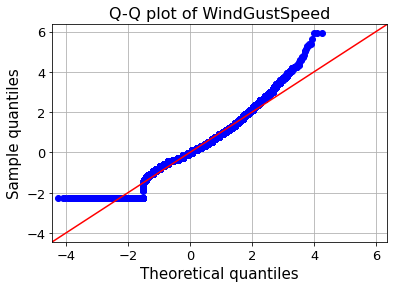

<Figure size 576x360 with 0 Axes>

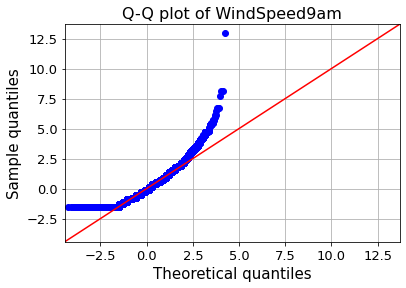

<Figure size 576x360 with 0 Axes>

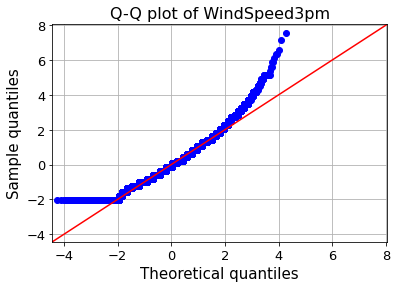

<Figure size 576x360 with 0 Axes>

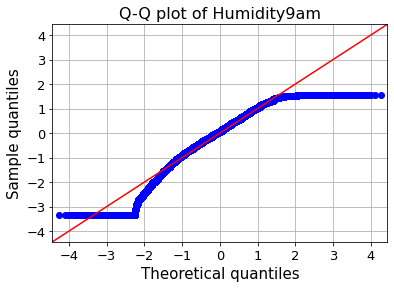

<Figure size 576x360 with 0 Axes>

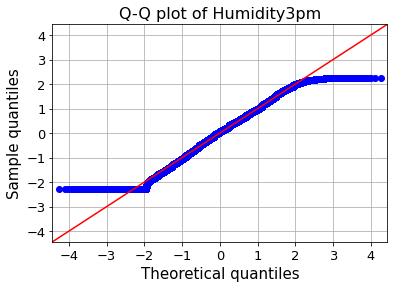

<Figure size 576x360 with 0 Axes>

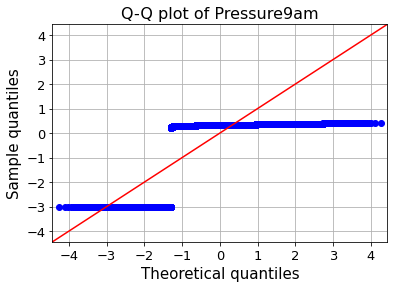

<Figure size 576x360 with 0 Axes>

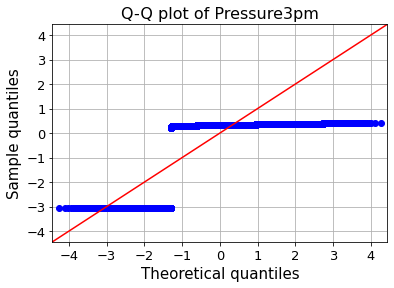

<Figure size 576x360 with 0 Axes>

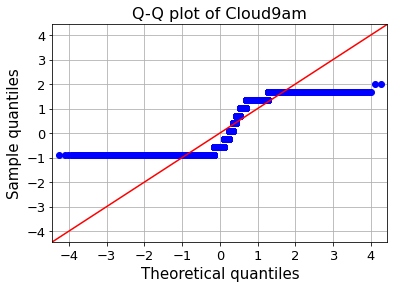

<Figure size 576x360 with 0 Axes>

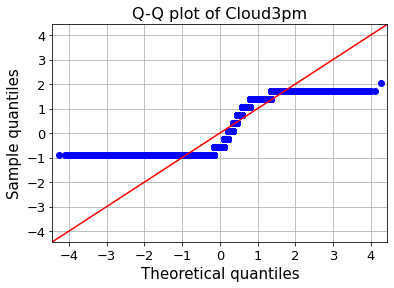

<Figure size 576x360 with 0 Axes>

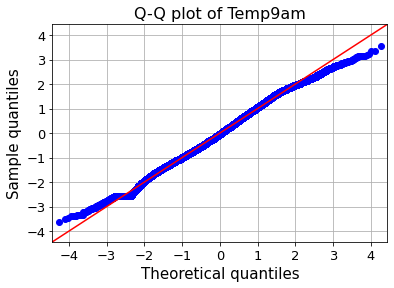

<Figure size 576x360 with 0 Axes>

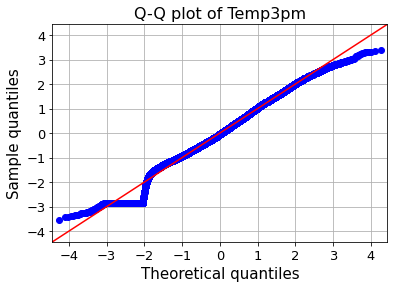

In [12]:
# Checking distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
data_norm= train_df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']].fillna(0)
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

- As observed from the above QQ plot, most of the predictor variables follow the normal distribution
- There are outliers observed in certain predictor variables like Rainfall and Evaporation which needs to be removed for increased accuracy

In [13]:
# Fetching numeric columns of the main data set for further processing
numeric_col = train_df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']]

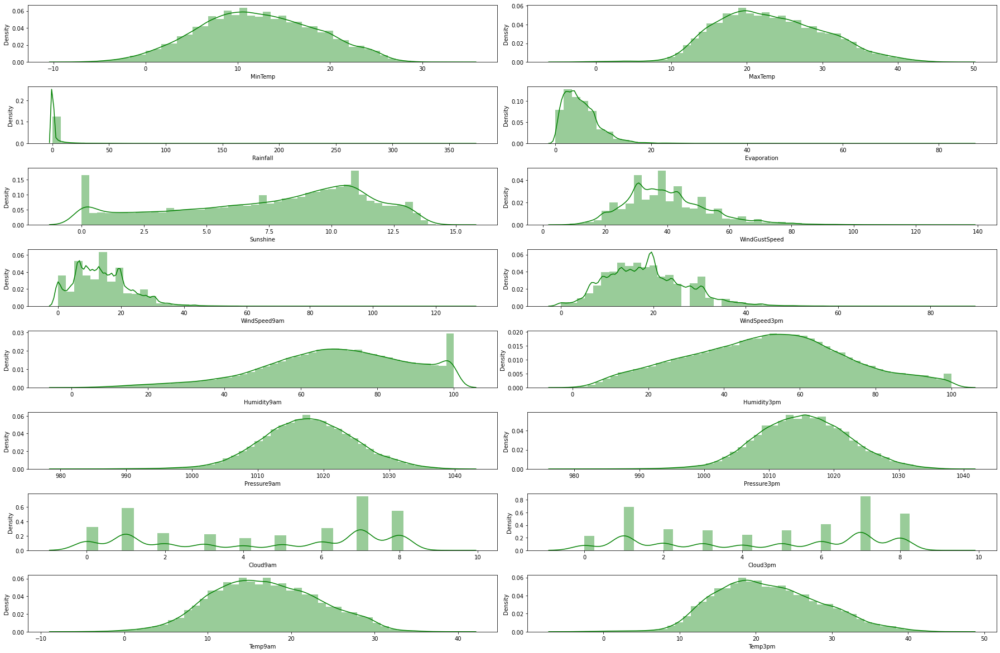

In [14]:
# Plotting a histogram to show the distribution of numeric variables
rows = 10
cols = 2
counter = 1
plt.rcParams['figure.figsize'] = [25, 20]
for i in numeric_col.columns:
    plt.subplot(rows, cols, counter)
    sns.distplot(train_df[i], color = 'Green')
    counter+=1
plt.tight_layout()
plt.show()

As observed, the distribution of numeric variables is as follows:
- MinTemp

  It is normally distributed

- MaxTemp

  It is normally distributed

- Rainfall

  It contains a lot of outliers which need to be removed to assess the distribution

- Evaporation

  It is right skewed

- Sunshine

  It looks pretty close to normal distribution

- WindGustSpeed

  It is right skewed

- WindSpeed9am

  It is right skewed

- WindSpeed3pm

  It is right skewed

- Humidity9am

  It is normally distributed

- Humidity3pm

  It is normally distributed

- Pressure9am

  It is normally distributed

- Pressure3pm

  It is normally distributed

- Cloud9am

  It is distributed with a very small range of values

- Cloud3pm

  It is distributed with a very small range of values

- Temp9am

  It is normally distributed

- Temp3pm

  It is normally distributed

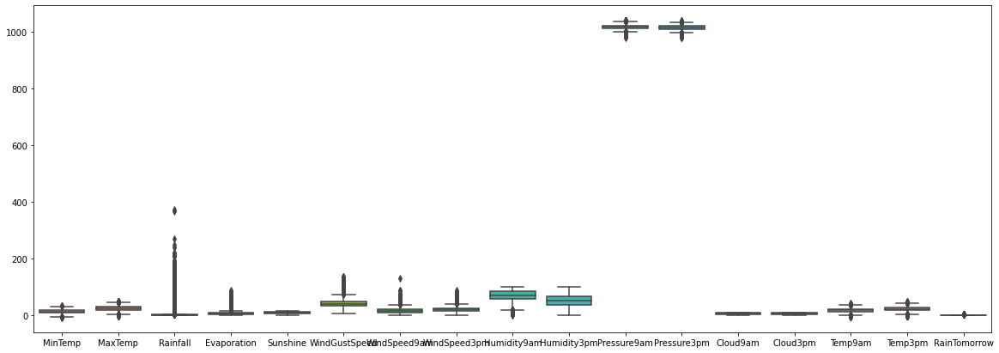

In [15]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,7))
sns.boxplot(data=train_df)

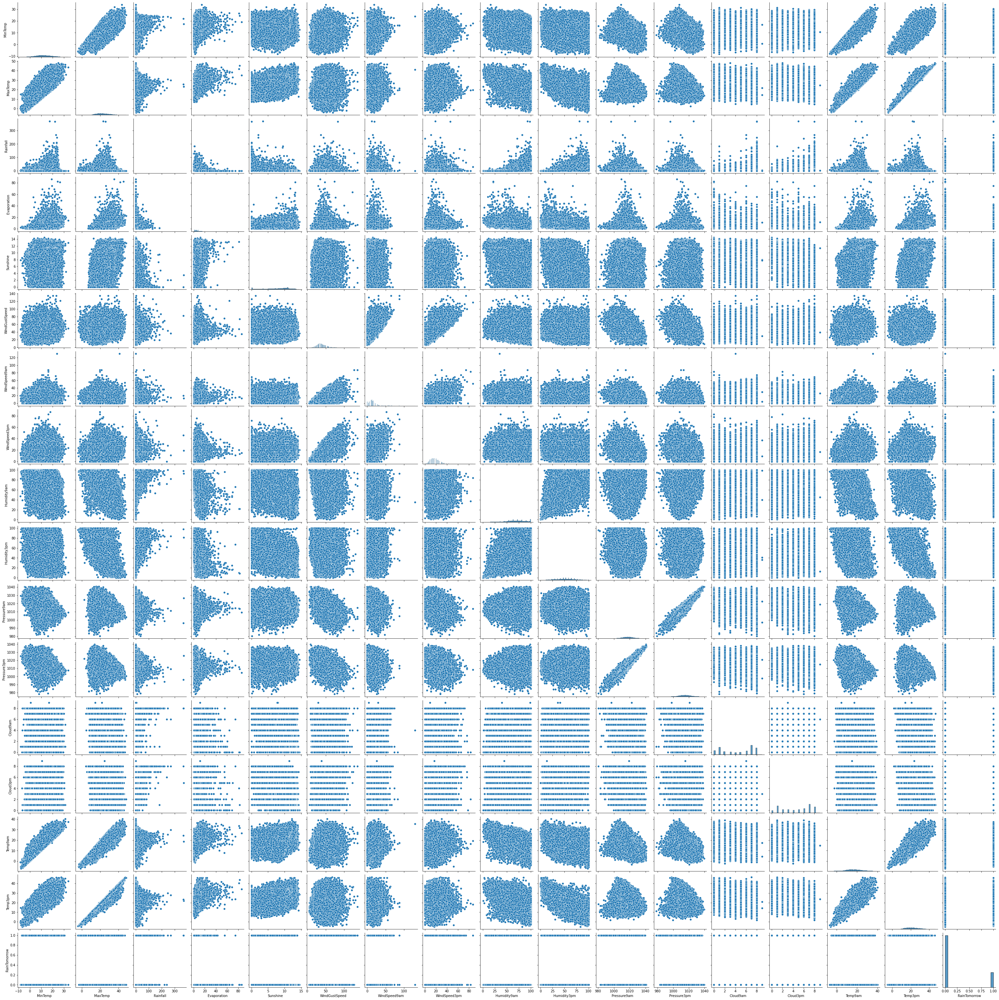

In [16]:
# Plotting pairwise relationships in the data set
sns.pairplot(train_df)

In [17]:
# Generating correlation of data set
train_df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
MinTemp,1.000000,0.736875,0.104381,0.472989,0.075160,0.178870,0.178109,0.174126,-0.236926,0.004391,-0.453020,-0.463388,0.072978,0.017827,0.902106,0.709646,0.084531
MaxTemp,0.736875,1.000000,-0.074307,0.595553,0.469390,0.071328,0.018079,0.050841,-0.507118,-0.509828,-0.335206,-0.429688,-0.291580,-0.278339,0.887055,0.984583,-0.159600
Rainfall,0.104381,-0.074307,1.000000,-0.066607,-0.226291,0.134978,0.088074,0.061296,0.221816,0.254877,-0.167112,-0.125644,0.195769,0.168513,0.011792,-0.079467,0.238673
Evaporation,0.472989,0.595553,-0.066607,1.000000,0.366921,0.205621,0.196003,0.127657,-0.508250,-0.394670,-0.275554,-0.299105,-0.189822,-0.183065,0.550939,0.580341,-0.115249
Sunshine,0.075160,0.469390,-0.226291,0.366921,1.000000,-0.028070,0.011742,0.056013,-0.489601,-0.627573,0.037629,-0.021898,-0.673911,-0.702497,0.291211,0.489193,-0.448849
WindGustSpeed,0.178870,0.071328,0.134978,0.205621,-0.028070,1.000000,0.605928,0.686974,-0.219033,-0.028536,-0.459155,-0.414703,0.068606,0.107094,0.153288,0.035890,0.234079
WindSpeed9am,0.178109,0.018079,0.088074,0.196003,0.011742,0.605928,1.000000,0.518251,-0.274180,-0.031865,-0.229440,-0.176732,0.023075,0.053459,0.132218,0.007739,0.091227
WindSpeed3pm,0.174126,0.050841,0.061296,0.127657,0.056013,0.686974,0.518251,1.000000,-0.146106,0.015558,-0.295857,-0.255049,0.054920,0.027031,0.162756,0.028095,0.088844
Humidity9am,-0.236926,-0.507118,0.221816,-0.508250,-0.489601,-0.219033,-0.274180,-0.146106,1.000000,0.666067,0.142630,0.189839,0.448979,0.353328,-0.475141,-0.501223,0.255922
Humidity3pm,0.004391,-0.509828,0.254877,-0.394670,-0.627573,-0.028536,-0.031865,0.015558,0.666067,1.000000,-0.024282,0.054166,0.513929,0.520199,-0.222325,-0.558402,0.445005


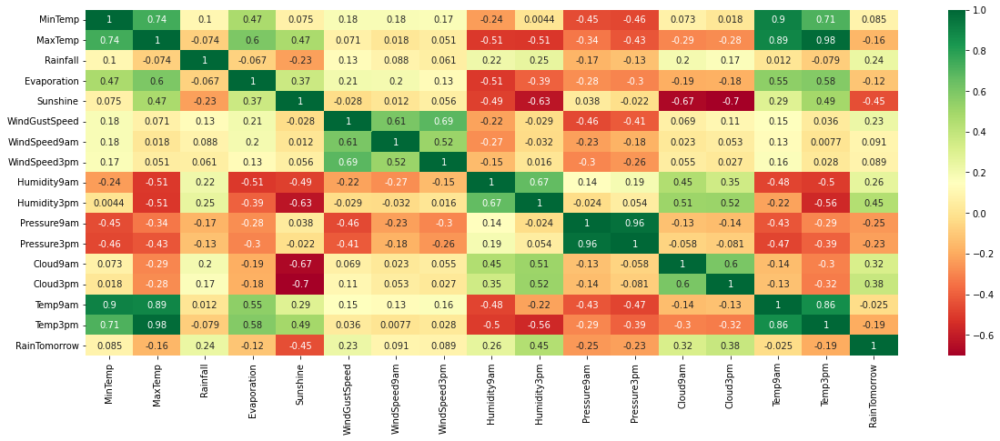

In [18]:
# Plotting Heat Map to check correlation for the data set 
plt.figure(figsize=(20,7))
sns.heatmap(train_df.corr(), annot=True, cmap='RdYlGn')

We can see that lots of variables have high correlation upon other predictor variables. The highest correlation observed is between Temp3pm and MaxTemp which shows presence of multicollinearity.

## One Hot Encoding 

One-hot encoding is a process of converting categorical variables into numerical variables, also known as dummy variables. It involves converting each categorical value into a new binary feature, with a value of 1 indicating the presence of a specific category value in a data sample, and 0 indicating its absence. Each category value in the original feature will result in a separate feature column in the resulting one-hot encoded data.

Refer: https://www.geeksforgeeks.org/ml-one-hot-encoding-of-datasets-in-python/

In [19]:
from sklearn.preprocessing import OneHotEncoder # Library is used to encode the categorical variables for further processing

In [20]:
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0
2,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0
3,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,0
4,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,0


In [21]:
# Replacing Null Categorical values with the mode of that column
for i in train_df[['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']]:
    train_df[i].fillna(train_df[i].mode()[0], inplace=True)

In [22]:
# Searching for NULL values in the DataFrame
train_df.isnull().sum()

Location             0
MinTemp            443
MaxTemp            230
Rainfall           979
Evaporation      42531
Sunshine         47317
WindGustDir          0
WindGustSpeed     6480
WindDir9am           0
WindDir3pm           0
WindSpeed9am       935
WindSpeed3pm      1835
Humidity9am       1233
Humidity3pm       2506
Pressure9am       9748
Pressure3pm       9736
Cloud9am         37572
Cloud3pm         40002
Temp9am            614
Temp3pm           1904
RainToday            0
RainTomorrow         0
dtype: int64

In [23]:
# Creating an instance of the OneHotEncoder class
encoder = OneHotEncoder()

# Encoding the categorical variables using the fit_transform method
encoded_data = encoder.fit_transform(train_df[['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']])

# Converting the encoded data to a DataFrame
encoded_df = pd.DataFrame(encoded_data.toarray(), columns=encoder.get_feature_names_out(['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']))

# Printing the encoded DataFrame
encoded_df.head()

,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [24]:
# Removing the old categorical columns from the DataFrame after encoding
train_df = train_df.drop(columns=['Location', 'WindGustDir', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday'])

In [25]:
# Concatenating the encoded DataFrame with the main DataFrame
final_train_df = pd.concat([train_df, encoded_df], axis=1)

## Imputation

Imputation techniques are methods used to fill missing or incomplete values in a dataset. There are several imputation techniques available, including:

- Mean Imputation
- Median Imputation
- Most Frequent Imputation
- KNN Imputation
- MICE Imputation

Refer: https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779

### Simple Imputer

The SimpleImputer is a class in scikit-learn's preprocessing library that provides basic strategies for imputing missing values. It supports replacing missing values using the mean, median, most frequent (mode), or a constant value. SimpleImputer works by transforming the dataset in-place by replacing the missing values with the desired imputed values.

Refer: https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html

### Median Imputation

In [26]:
from sklearn.impute import SimpleImputer # Library is required to perform Simple Imputation
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [27]:
# Remove a certain percentage of data randomly
percentage = [0.01, 0.05, 0.10]
numeric_train_df = final_train_df[~final_train_df.isnull().any(axis=1)]

for i in percentage:

    # Randomly replacing 1%, 5% and 10% data from the DataFrame with NaN values
    missing_mask = np.random.rand(numeric_train_df.shape[0], numeric_train_df.shape[1]) < i
    train_df_missing = numeric_train_df.copy()
    train_df_missing[missing_mask] = np.nan

    # Initialize the SimpleImputer using Most Frequent strategy
    imputer = SimpleImputer(strategy='median')

    # Fit the imputer on the training set
    imputer.fit(train_df_missing)

    # Use the imputer to transform the training set
    train_df_imputed = imputer.transform(train_df_missing)

    # Calculate the mean absolute error (MAE), mean squared error (MSE) and Correlation (R2)
    mae = mean_absolute_error(numeric_train_df, train_df_imputed)
    mse = mean_squared_error(numeric_train_df, train_df_imputed)
    r2 = r2_score(numeric_train_df, train_df_imputed)

    # Calculate the residuals (actual values - predicted values)
    residuals = abs(numeric_train_df - train_df_imputed)

    # Calculate the mean of the residuals
    residual_mean = np.mean(residuals)

    # Calculate Bias and Variance
    residual_variance = np.mean(np.var(residuals))
    bias = np.mean(residual_mean**2)

    # Calculate Percent Error on Residuals
    per_error = (np.mean(np.sum(residuals) / np.sum(numeric_train_df))) * 100

    # Print the results
    print("Mean Absolute Error for " + str(i*100) + "% of missing values:", round(mae, 5))
    print("Mean Squared Error for " + str(i*100) + "% of missing values:", round(mse, 5))
    print("R-Squared for " + str(i*100) + "% of missing values:", round(r2, 5))
    print("Bias: ", round(bias, 5))
    print("Percent Error on Residuals: ", round(per_error, 5))
    print("Variance: ", round(residual_variance, 5), "\n")

Mean Absolute Error for 1.0% of missing values: 0.00796
Mean Squared Error for 1.0% of missing values: 0.10613
R-Squared for 1.0% of missing values: 0.99118
Bias:  0.00065
Percent Error:  0.91246
Variance:  0.10548 

Mean Absolute Error for 5.0% of missing values: 0.03994
Mean Squared Error for 5.0% of missing values: 0.5576
R-Squared for 5.0% of missing values: 0.95574
Bias:  0.01656
Percent Error:  4.56275
Variance:  0.54104 

Mean Absolute Error for 10.0% of missing values: 0.08075
Mean Squared Error for 10.0% of missing values: 1.11887
R-Squared for 10.0% of missing values: 0.91228
Bias:  0.06842
Percent Error:  9.032
Variance:  1.05045 



#### Most Frequent Imputation

In [28]:
# Remove a certain percentage of data randomly
percentage = [0.01, 0.05, 0.10]
numeric_train_df = final_train_df[~final_train_df.isnull().any(axis=1)]

for i in percentage:

    # Randomly replacing 1%, 5% and 10% data from the DataFrame with NaN values
    missing_mask = np.random.rand(numeric_train_df.shape[0], numeric_train_df.shape[1]) < i
    train_df_missing = numeric_train_df.copy()
    train_df_missing[missing_mask] = np.nan

    # Initialize the SimpleImputer with strategy='median'
    imputer = SimpleImputer(strategy='most_frequent')

    # Fit the imputer on the training set
    imputer.fit(train_df_missing)

    # Use the imputer to transform the training set
    train_df_imputed = imputer.transform(train_df_missing)

    # Calculate the mean absolute error (MAE), mean squared error (MSE) and Correlation (R2)
    mae = mean_absolute_error(numeric_train_df, train_df_imputed)
    mse = mean_squared_error(numeric_train_df, train_df_imputed)
    r2 = r2_score(numeric_train_df, train_df_imputed)

    # Calculate the residuals (actual values - predicted values)
    residuals = abs(numeric_train_df - train_df_imputed)

    # Calculate the mean of the residuals
    residual_mean = np.mean(residuals)

    # Calculate Bias and Variance
    residual_variance = np.mean(np.var(residuals))
    bias = np.mean(residual_mean**2)

    # Calculate Percent Error on Residuals
    per_error = (np.mean(np.sum(residuals) / np.sum(numeric_train_df))) * 100

    # Print the results
    print("Mean Absolute Error for " + str(i*100) + "% of missing values:", round(mae, 5))
    print("Mean Squared Error for " + str(i*100) + "% of missing values:", round(mse, 5))
    print("R-Squared for " + str(i*100) + "% of missing values:", round(r2, 5))
    print("Bias: ", round(bias, 5))
    print("Percent Error on Residuals: ", round(per_error, 5))
    print("Variance: ", round(residual_variance, 5), "\n")

Mean Absolute Error for 1.0% of missing values: 0.00876
Mean Squared Error for 1.0% of missing values: 0.12254
R-Squared for 1.0% of missing values: 0.99055
Bias:  0.00076
Percent Error:  0.92878
Variance:  0.12177 

Mean Absolute Error for 5.0% of missing values: 0.04313
Mean Squared Error for 5.0% of missing values: 0.60894
R-Squared for 5.0% of missing values: 0.9533
Bias:  0.01846
Percent Error:  4.56821
Variance:  0.59049 

Mean Absolute Error for 10.0% of missing values: 0.08716
Mean Squared Error for 10.0% of missing values: 1.24658
R-Squared for 10.0% of missing values: 0.9075
Bias:  0.07627
Percent Error:  9.0267
Variance:  1.17031 



### MICE Imputation

MICE (Multivariate Imputation by Chained Equations) is a statistical imputation technique that handles missing data in a dataset. It works by creating multiple imputed datasets and then combining the results to get a final imputed dataset. 

The idea behind this technique is to use the information in other variables to predict the missing values in each variable.

Refer: https://scikit-learn.org/stable/modules/impute.html

In [29]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer # Library is required to perform Multivariate Imputation by Chained Equations (MICE) Imputation

In [30]:
# Remove a certain percentage of data randomly
percentage = [0.01, 0.05, 0.10]
numeric_train_df = final_train_df[~final_train_df.isnull().any(axis=1)]

for i in percentage:
    
    # Randomly replacing 1%, 5% and 10% data from the DataFrame with NaN values
    missing_mask = np.random.rand(numeric_train_df.shape[0], numeric_train_df.shape[1]) < i
    train_df_missing = numeric_train_df.copy()
    train_df_missing[missing_mask] = np.nan

    # Use MICE to fill in missing values
    imputer = IterativeImputer(random_state=0, n_nearest_features=3)
    X_filled_mice = imputer.fit_transform(train_df_missing)


    # Calculate the mean absolute error (MAE), mean squared error (MSE) and Correlation (R2)
    mae = mean_absolute_error(numeric_train_df, X_filled_mice)
    mse = mean_squared_error(numeric_train_df, X_filled_mice)
    r2 = r2_score(numeric_train_df, X_filled_mice)

    # Calculate the residuals (actual values - predicted values)
    residuals = abs(numeric_train_df - X_filled_mice)

    # Calculate the mean of the residuals
    residual_mean = np.mean(residuals)

    # Calculate Bias and Variance
    residual_variance = np.mean(np.var(residuals))
    bias = np.mean(residual_mean**2)

    # Calculate Percent Error on Residuals
    per_error = (np.mean(np.sum(residuals) / np.sum(numeric_train_df))) * 100

    # Print the results
    print("Mean Absolute Error for " + str(i*100) + "% of missing values:", round(mae, 5))
    print("Mean Squared Error for " + str(i*100) + "% of missing values:", round(mse, 5))
    print("R-Squared for " + str(i*100) + "% of missing values:", round(r2, 5))
    print("Bias: ", round(bias, 5))
    print("Percent Error on Residuals: ", round(per_error, 5))
    print("Variance: ", round(residual_variance, 5), "\n")

Mean Absolute Error for 1.0% of missing values: 0.00623
Mean Squared Error for 1.0% of missing values: 0.06371
R-Squared for 1.0% of missing values: 0.9936
Bias:  0.00038
Percent Error:  1.37526
Variance:  0.06333 

Mean Absolute Error for 5.0% of missing values: 0.03476
Mean Squared Error for 5.0% of missing values: 0.42816
R-Squared for 5.0% of missing values: 0.96643
Bias:  0.01358
Percent Error:  7.00416
Variance:  0.41457 

Mean Absolute Error for 10.0% of missing values: 0.06492
Mean Squared Error for 10.0% of missing values: 0.69865
R-Squared for 10.0% of missing values: 0.93294
Bias:  0.04187
Percent Error:  13.94793
Variance:  0.65678 



##### Comparing the three imputation methods, we observed that MICE Imputation fits the best upon this data set since its R2 score remains the highest among the three, the higher the percentage of data is considered. Therefore, we use MICE Imputation to impute all the NaN values in the main DataFrame.

In [31]:
# Using MICE Imputation to impute Missing Values
final_train_df = pd.DataFrame(imputer.fit_transform(final_train_df), columns = final_train_df.columns)

In [32]:
final_train_df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
0,13.4,22.9,0.6,5.589730,5.143878,44.0,20.0,24.0,71.0,22.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,7.4,25.1,0.0,4.924414,8.864299,44.0,4.0,22.0,44.0,25.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
2,17.5,32.3,1.0,5.589730,5.449981,41.0,7.0,20.0,82.0,33.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,14.6,29.7,0.2,4.924414,8.658145,56.0,19.0,24.0,55.0,23.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,7.7,26.7,0.0,5.589730,8.660081,35.0,6.0,17.0,48.0,19.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [33]:
# Searching for NULL values in the DataFrame
final_train_df.isnull().sum()

MinTemp           0
MaxTemp           0
Rainfall          0
Evaporation       0
Sunshine          0
                 ..
WindDir3pm_W      0
WindDir3pm_WNW    0
WindDir3pm_WSW    0
RainToday_No      0
RainToday_Yes     0
Length: 132, dtype: int64

In [34]:
# Fetching numeric variables inside a DataFrame for further processing
numeric_df = final_train_df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']]
numeric_df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,5.589730,5.143878,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,6.413997,16.9,21.8
1,7.4,25.1,0.0,4.924414,8.864299,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.457140,4.135976,17.2,24.3
2,17.5,32.3,1.0,5.589730,5.449981,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
3,14.6,29.7,0.2,4.924414,8.658145,56.0,19.0,24.0,55.0,23.0,1009.2,1005.4,4.144165,4.149152,20.6,28.9
4,7.7,26.7,0.0,5.589730,8.660081,35.0,6.0,17.0,48.0,19.0,1013.4,1010.1,4.516682,4.231067,16.3,25.5


### Correlation

Correlation is a statistical measure that indicates the extent to which two or more variables fluctuate together. It ranges from -1 to 1, with -1 indicating a perfect negative correlation, 1 indicating a perfect positive correlation, and 0 indicating no correlation at all. 

A positive correlation means the variables increase or decrease together, while a negative correlation means that as one variable increases, the other decreases.

Refer: https://www.geeksforgeeks.org/exploring-correlation-in-python/

In [35]:
# Checking correlation between all the features in the data
final_train_df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
MinTemp,1.000000,0.737068,0.102687,0.361921,0.104276,0.176808,0.177222,0.172374,-0.237063,-0.003574,...,-0.011580,0.055582,0.023694,-0.035757,-0.046018,-0.078607,-0.046004,-0.059116,-0.056915,0.056915
MaxTemp,0.737068,1.000000,-0.073905,0.448774,0.449927,0.071148,0.018670,0.050388,-0.505771,-0.507682,...,-0.057823,0.005904,-0.012866,-0.062015,-0.055044,-0.070545,-0.026193,-0.059701,0.225529,-0.225529
Rainfall,0.102687,-0.073905,1.000000,-0.037744,-0.252596,0.127484,0.087506,0.061276,0.220713,0.248441,...,0.019839,0.010218,0.013207,0.025414,0.011470,0.016152,0.009930,0.012421,-0.499912,0.499912
Evaporation,0.361921,0.448774,-0.037744,1.000000,0.293323,0.152061,0.141328,0.091817,-0.379907,-0.290090,...,-0.009378,0.018238,0.018912,-0.007456,0.001009,-0.029371,-0.030001,-0.011056,0.141206,-0.141206
Sunshine,0.104276,0.449927,-0.252596,0.293323,1.000000,-0.018707,0.029126,0.045374,-0.536223,-0.595609,...,-0.026646,0.000041,-0.007403,-0.019054,0.017995,-0.019579,-0.016720,0.006169,0.338298,-0.338298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WindDir3pm_W,-0.078607,-0.070545,0.016152,-0.029371,-0.019579,0.091307,0.027340,0.059508,0.002924,-0.018303,...,-0.073041,-0.091501,-0.071458,-0.066484,-0.071846,1.000000,-0.069507,-0.072965,-0.046430,0.046430
WindDir3pm_WNW,-0.046004,-0.026193,0.009930,-0.030001,-0.016720,0.087862,0.014936,0.056807,-0.002152,-0.034185,...,-0.068176,-0.085407,-0.066699,-0.062056,-0.067061,-0.069507,1.000000,-0.068105,-0.030469,0.030469
WindDir3pm_WSW,-0.059116,-0.059701,0.012421,-0.011056,0.006169,0.056712,0.014850,0.040393,-0.009028,-0.017486,...,-0.071568,-0.089656,-0.070017,-0.065143,-0.070397,-0.072965,-0.068105,1.000000,-0.045505,0.045505
RainToday_No,-0.056915,0.225529,-0.499912,0.141206,0.338298,-0.146743,-0.099725,-0.080421,-0.349321,-0.370974,...,-0.031236,-0.007370,-0.010036,-0.045359,-0.038936,-0.046430,-0.030469,-0.045505,1.000000,-1.000000


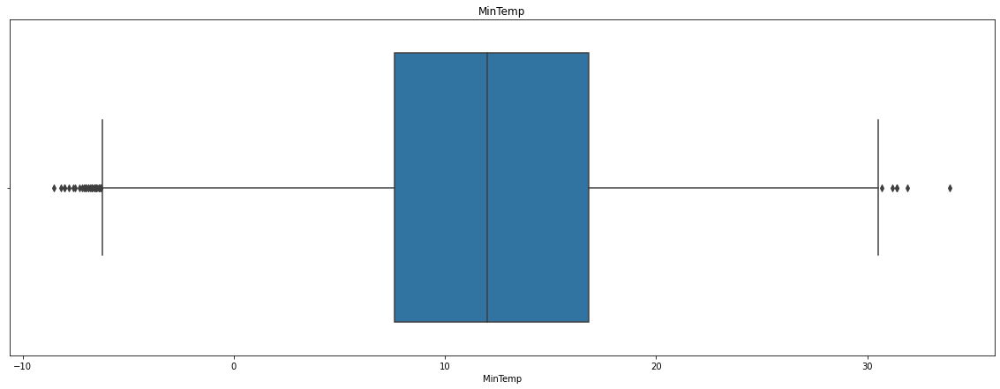

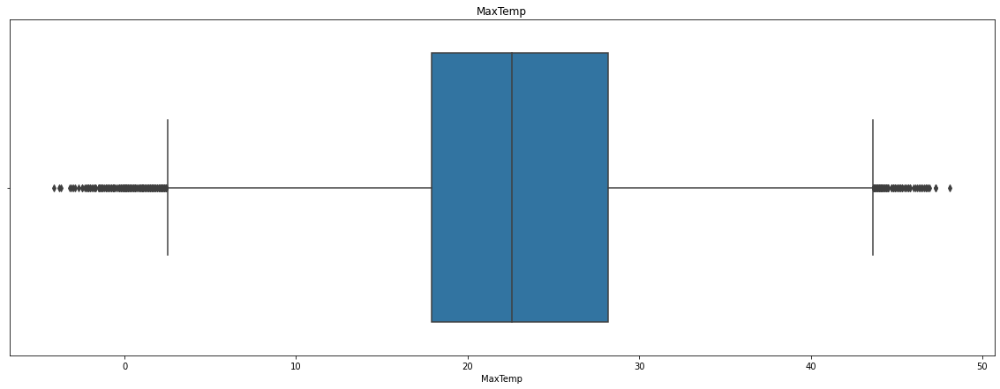

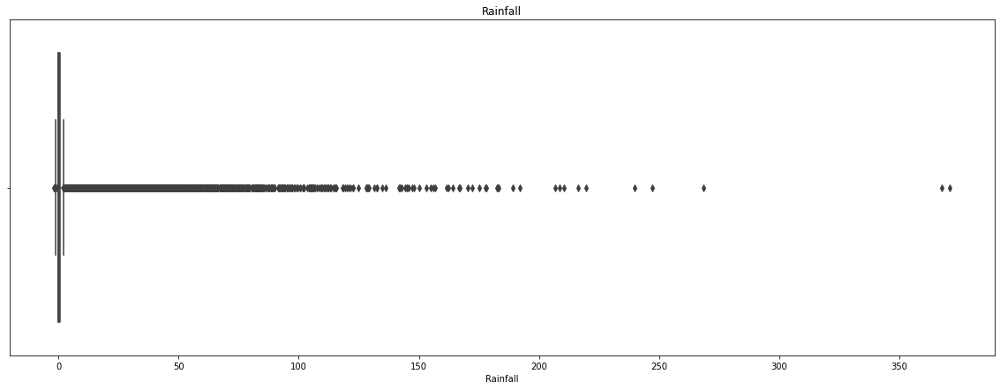

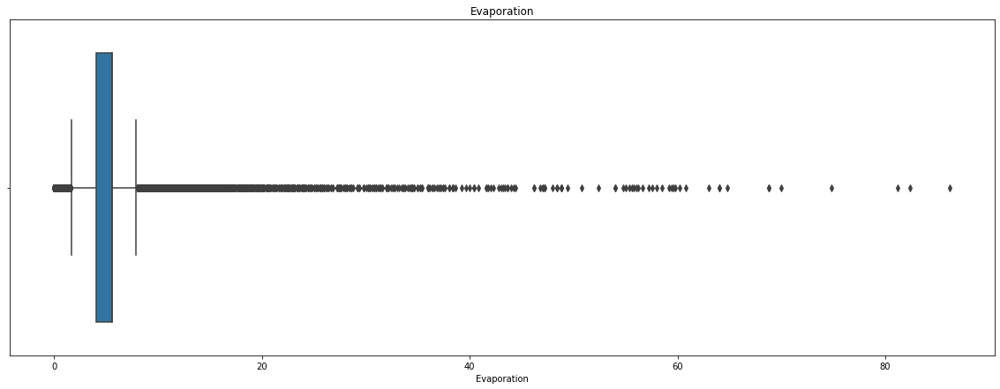

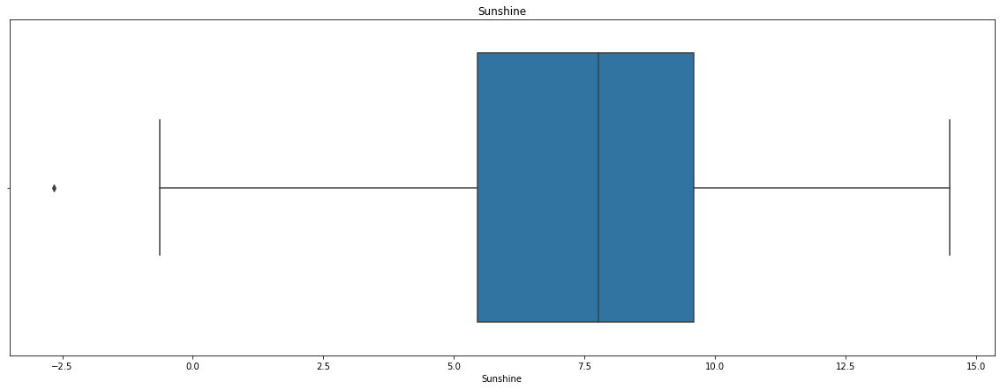

...

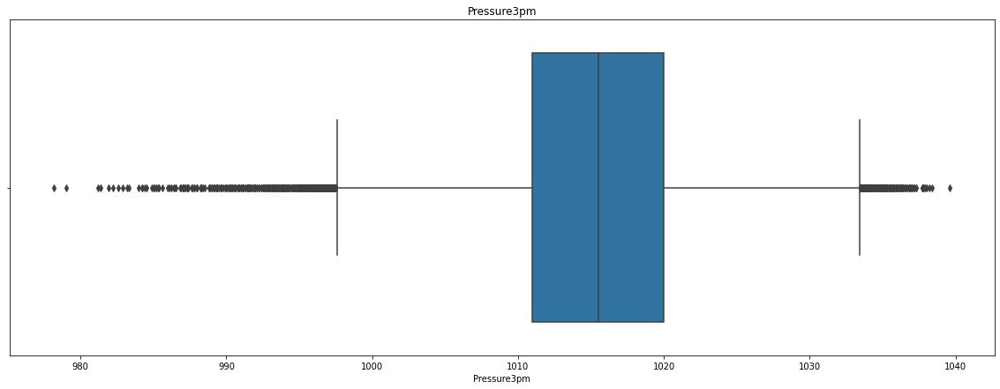

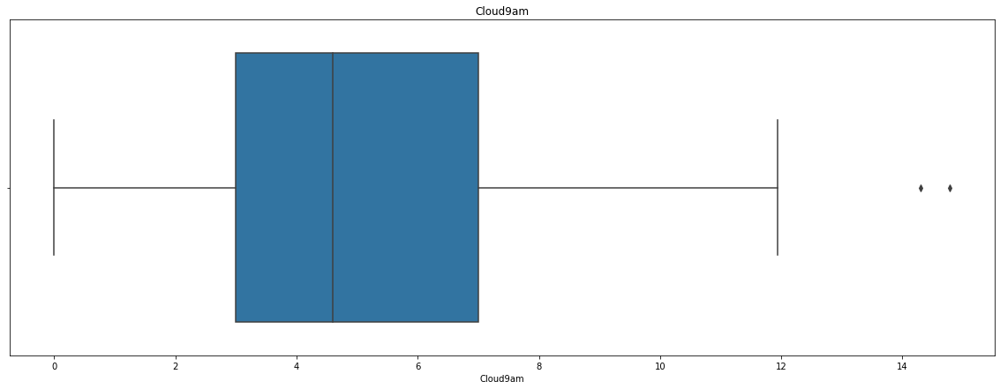

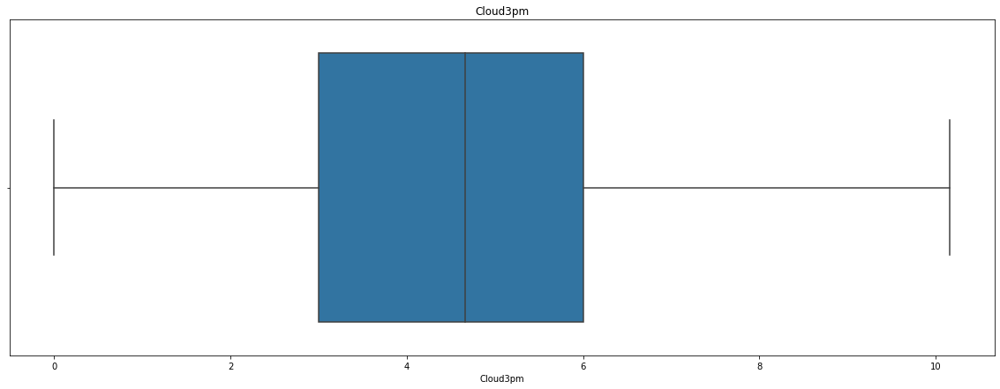

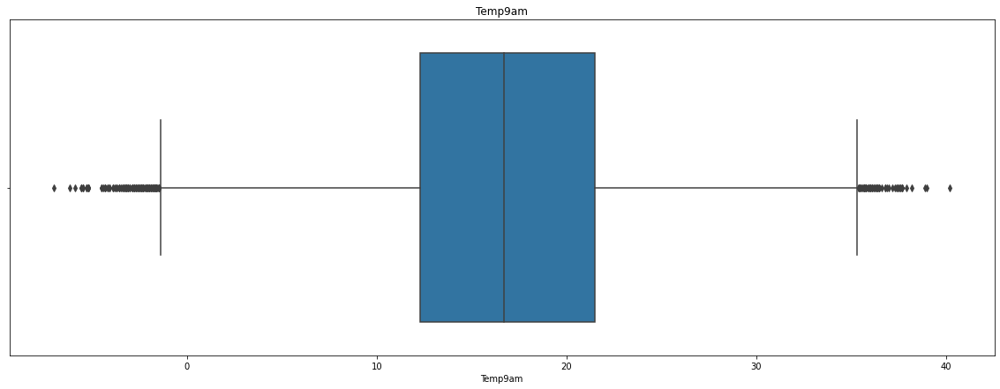

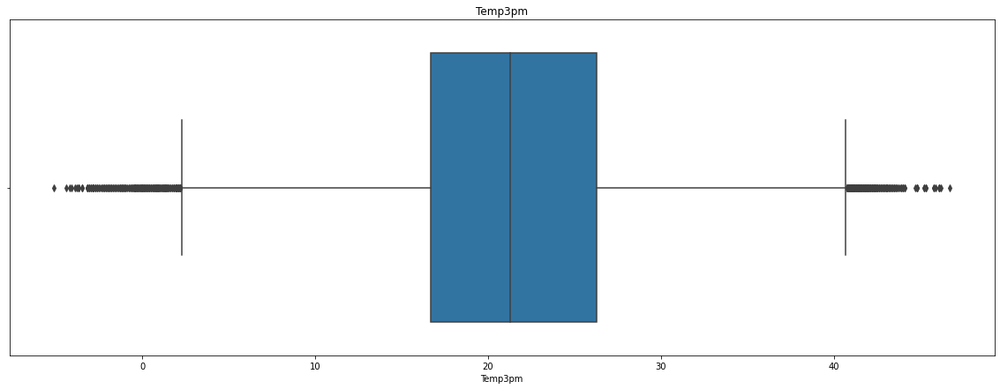

In [36]:
# Plotting distributions with respect to categories after encoding
for i in numeric_df.columns:
  plt.figure(figsize=(20,7))
  sns.boxplot(numeric_df[i])
  plt.title(i)
  plt.show()

In [37]:
# Heat Map of the correlation
plt.figure(figsize=(500,250))
sns.heatmap(final_train_df.corr(), annot=True, cmap='RdYlGn')

## Test Train Split

Initially, data set needs to be split into features (X) and target (y).
The Test-Train Split is a commonly used procedure for evaluating the performance of a machine learning algorithm. It involves dividing a dataset into two parts: 
- #### Training Set
  
  It is used to train the machine learning model
- #### Test Set
  
  It is used to evaluate its performance.

In [38]:
from sklearn.model_selection import train_test_split # Library is required to split the data set into training set and test set

In [39]:
# Splitting the main DataFrame into X and y to perform regression
X = final_train_df.drop(columns=['RainTomorrow'], axis = 1).values
y = final_train_df['RainTomorrow'].values

In [40]:
X

array([[13.4, 22.9,  0.6, ...,  0. ,  1. ,  0. ],
       [ 7.4, 25.1,  0. , ...,  1. ,  1. ,  0. ],
       [17.5, 32.3,  1. , ...,  0. ,  1. ,  0. ],
       ...,
       [ 2.8, 23.4,  0. , ...,  0. ,  1. ,  0. ],
       [ 3.6, 25.3,  0. , ...,  0. ,  1. ,  0. ],
       [ 5.4, 26.9,  0. , ...,  0. ,  1. ,  0. ]])

In [41]:
y

array([0., 0., 0., ..., 0., 0., 0.])

In [42]:
# Splitting the Data set into 80% Training set and 20% Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [43]:
X_train

array([[19.5, 26.2,  0. , ...,  0. ,  1. ,  0. ],
       [ 6.9, 23.5,  0. , ...,  0. ,  1. ,  0. ],
       [ 5.7, 16.2,  0. , ...,  1. ,  1. ,  0. ],
       ...,
       [15.1, 20.1,  0. , ...,  0. ,  1. ,  0. ],
       [15.9, 39.7,  0. , ...,  0. ,  1. ,  0. ],
       [13.9, 25.8,  0.2, ...,  1. ,  1. ,  0. ]])

In [44]:
X_test

array([[12.1, 23.3,  0. , ...,  0. ,  1. ,  0. ],
       [10. , 20.3,  0. , ...,  0. ,  1. ,  0. ],
       [12.3, 21.4,  0. , ...,  0. ,  1. ,  0. ],
       ...,
       [ 6.6, 20.8,  0. , ...,  0. ,  1. ,  0. ],
       [14.9, 33.2,  0. , ...,  0. ,  1. ,  0. ],
       [ 6.1, 16.9,  2. , ...,  0. ,  0. ,  1. ]])

In [45]:
y_train

array([0., 0., 0., ..., 0., 0., 0.])

In [46]:
y_test

array([0., 0., 0., ..., 0., 0., 0.])

## Feature Scaling

Feature scaling is a technique in data preprocessing where the values of the features are transformed and standardized to have a similar range of values. This is done to bring all the features to the same level of magnitude, so that the model does not get swayed by the feature with a large magnitude. There are two common feature scaling techniques: 
- #### Min-Max Scaling

 Min-Max scaling scales the values between 0 and 1
- #### Standardization 

  It transforms the values to have a mean of 0 and a standard deviation of 1.

Refer: https://www.analyticsvidhya.com/blog/2021/05/feature-scaling-techniques-in-python-a-complete-guide/

In [47]:
from sklearn.preprocessing import MinMaxScaler # Library is required to perform feature scaling using MinMaxScaler

In [48]:
# Fit MinMaxScaler on the training data
scaler = MinMaxScaler()
scaler.fit(X_train)

# Transform both the Training and Test data
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [49]:
X_train

array([[0.66037736, 0.58045977, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.36320755, 0.52873563, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.33490566, 0.38888889, 0.00478142, ..., 1.        , 1.        ,
        0.        ],
       ...,
       [0.55660377, 0.46360153, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.5754717 , 0.83908046, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.52830189, 0.57279693, 0.00531793, ..., 1.        , 1.        ,
        0.        ]])

In [50]:
X_test

array([[0.48584906, 0.52490421, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.43632075, 0.46743295, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.49056604, 0.48850575, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.35613208, 0.47701149, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.55188679, 0.71455939, 0.00478142, ..., 0.        , 1.        ,
        0.        ],
       [0.34433962, 0.40229885, 0.01014648, ..., 0.        , 0.        ,
        1.        ]])

### Visualizing the Training and Test Set

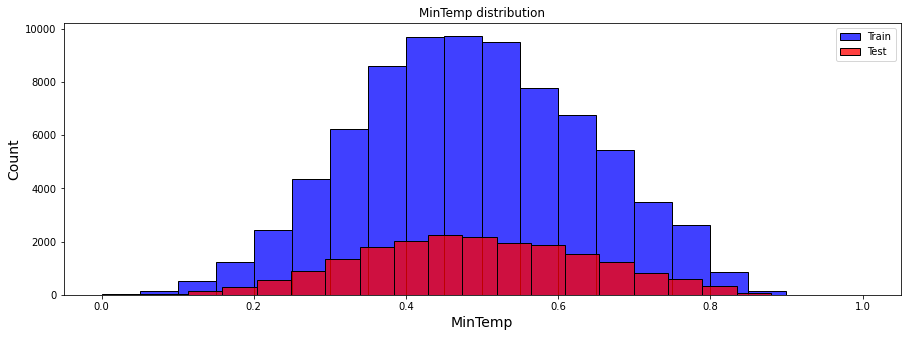

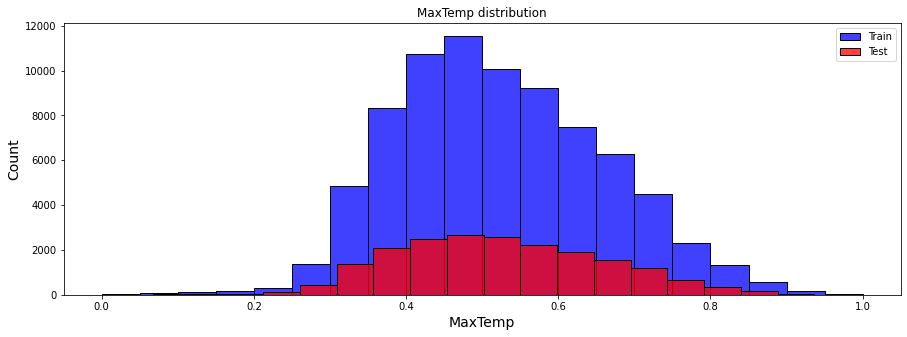

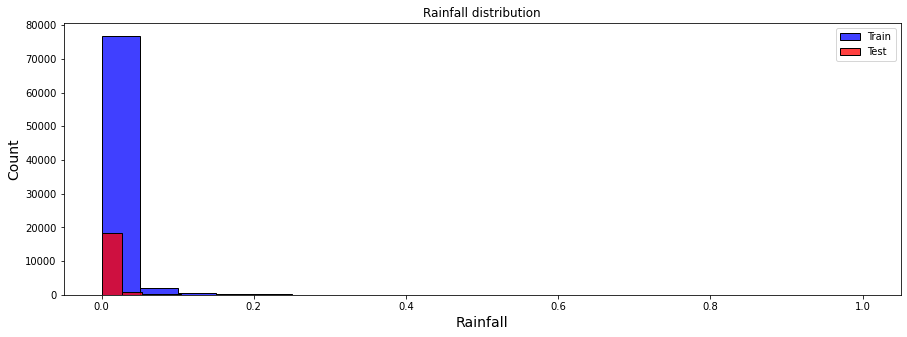

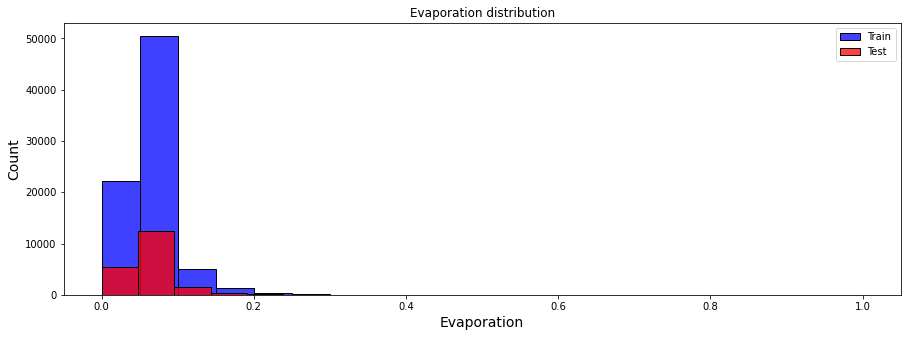

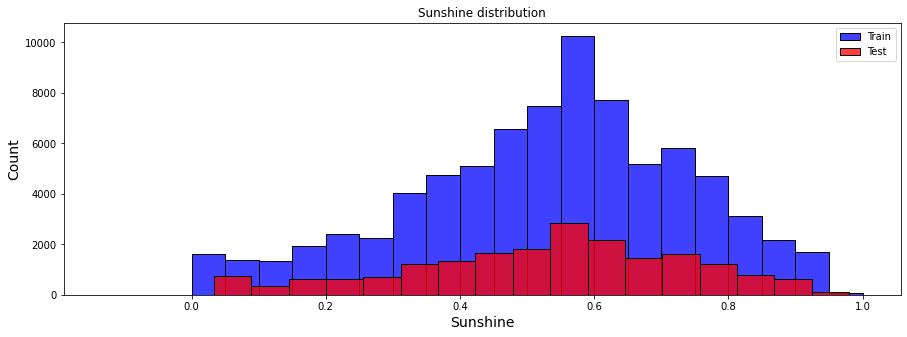

...

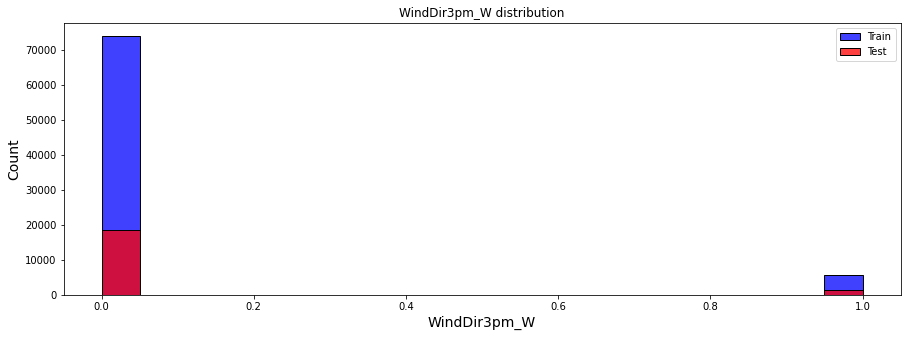

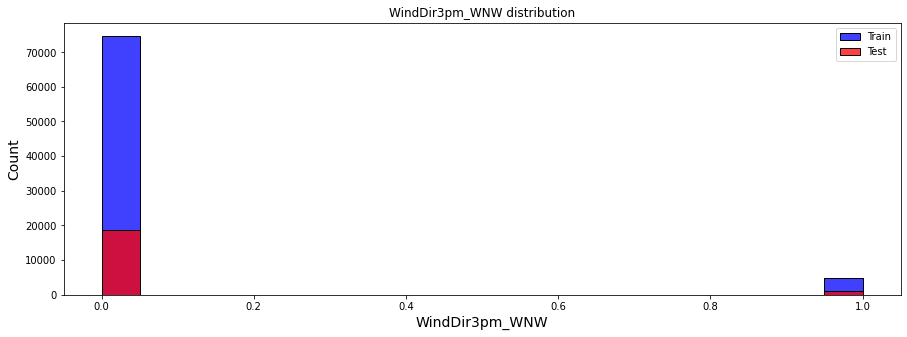

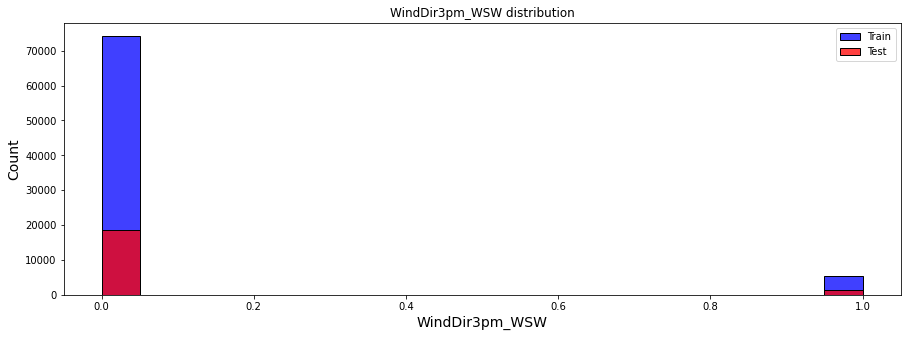

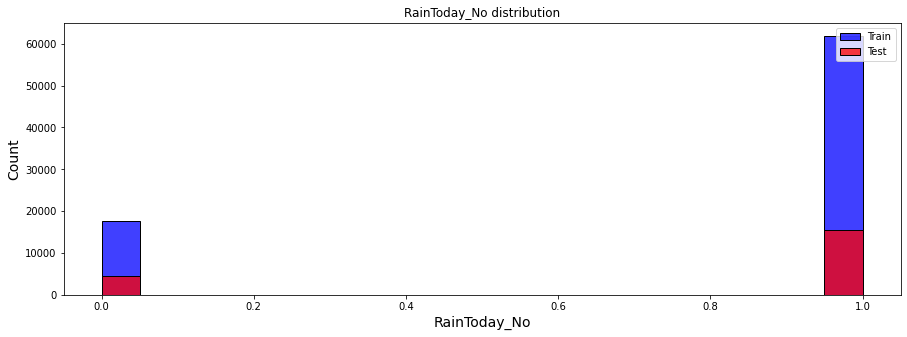

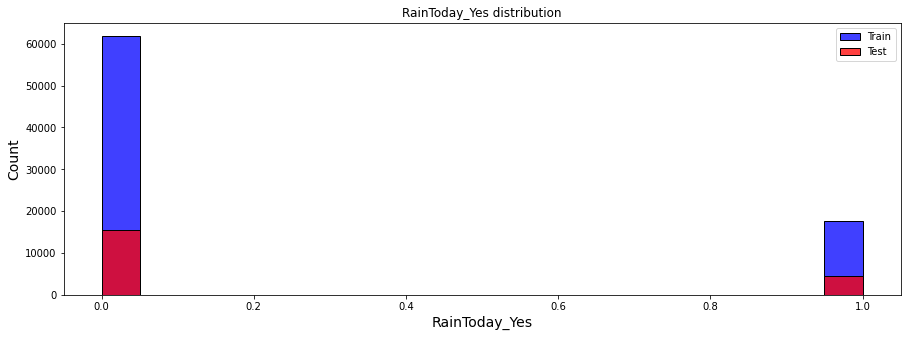

In [51]:
# Preparing DataFrames for Training and Test set for visualization
X_test_plot = pd.DataFrame(X_test, columns = final_train_df.drop(columns = ['RainTomorrow'], axis = 1).columns)
X_train_plot = pd.DataFrame(X_train, columns = final_train_df.drop(columns = ['RainTomorrow'], axis = 1).columns)

# Plotting the Training and Test set to visualize the data distribution
for c in X_test_plot.columns:
  plt.figure(figsize=(15,5))
  sns.histplot(X_train_plot[c], bins=20, color = 'blue', label = 'Train')
  sns.histplot(X_test_plot[c], bins=20, color = 'red', label = 'Test')
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

## Predictor Significance

Predictor significance refers to the importance of a predictor variable in explaining the variation in a response variable. It can be determined using various statistical methods, such as regression analysis, correlation, or feature importance algorithms, and is typically used in predictive modeling or hypothesis testing to identify the most influential variables affecting the response. 

A high predictor significance indicates that the predictor variable has a strong association with the response, while low significance suggests a weak or insignificant relationship.

Refer: https://www.geeksforgeeks.org/ordinary-least-squares-ols-using-statsmodels/

In [52]:
import statsmodels.api as sm # Library is required to calculate OLS for finding the P values to check the significant features

In [53]:
# Fitting the OLS model upon the Training set
model = sm.OLS(y, X).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.394
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                     587.5
Date:                Sun, 05 Feb 2023   Prob (F-statistic):               0.00
Time:                        02:27:18   Log-Likelihood:                -29330.
No. Observations:               99516   AIC:                         5.888e+04
Df Residuals:                   99405   BIC:                         5.994e+04
Df Model:                         110                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0038      0.001     -7.205      0.000      -0.005      -0.003
x2             0.0014      0.001      1.858      0.063   -7.68e-05       0.003
x3             0.0014      0.000      9.422      0.000       0.001       0.002
x4             0.0044      0.000     11.009      0.000       0.004       0.005
x5            -0.0624      0.001    -98.532      0.000      -0.064      -0.061
x6             0.0073      0.000     53.793      0.000       0.007       0.008
x7            -0.0006      0.000     -3.255      0.001      -0.001      -0.000
x8            -0.0036      0.000    -19.547      0.000      -0.004      -0.003
x9            -0.0013      0.000    -11.801      0.000      -0.001      -0.001
x10            0.0075      0.000     64.011      0.000       0.007       0.008
x11            0.0162      0.001     21.793      0.000       0.015       0.018
x12           -0.0244      0.001    -32.841      0.000      -0.026      -0.023
x13           -0.0298      0.001    -42.912      0.000      -0.031      -0.028
x14           -0.0063      0.001     -9.143      0.000      -0.008      -0.005
x15            0.0023      0.001      3.131      0.002       0.001       0.004
x16            0.0023      0.001      3.063      0.002       0.001       0.004
x17            0.3172      0.009     33.989      0.000       0.299       0.336
x18            0.2167      0.010     21.428      0.000       0.197       0.237
x19            0.2522      0.009     28.007      0.000       0.235       0.270
x20            0.2444      0.009     26.542      0.000       0.226       0.262
x21            0.2137      0.009     23.082      0.000       0.196       0.232
x22            0.1802      0.009     19.448      0.000       0.162       0.198
x23            0.2430      0.009     26.959      0.000       0.225       0.261
x24            0.2594      0.009     27.581      0.000       0.241       0.278
x25            0.2202      0.010     22.698      0.000       0.201       0.239
x26            0.2239      0.009     25.173      0.000       0.206       0.241
x27            0.2998      0.009     32.617      0.000       0.282       0.318
x28            0.2138      0.010     22.073      0.000       0.195       0.233
x29            0.2423      0.009     26.231      0.000       0.224       0.260
x30            0.2181      0.010     22.850      0.000       0.199       0.237
x31            0.1789      0.010     18.082      0.000       0.160       0.198
x32            0.1476      0.009     16.595      0.000       0.130       0.165
x33            0.1507      0.012     12.376      0.000       0.127       0.175
x34            0.1792      0.009     19.324      0.000       0.161       0.197
x35            0.2277      0.010     22.877      0.000       0.208       0.247
x36            0.1831      0.009     19.624      0.000       0.165       0.201
x3

## Logistic Regression

Logistic Regression is a type of supervised learning, which is used for solving binary classification problems. In binary classification, the goal is to predict one of two possible outcomes, given a set of inputs. The logistic regression model uses a logistic function to predict the probability of the positive class and maps it to binary predictions.

Refer: https://www.youtube.com/watch?v=yIYKR4sgzI8

In [54]:
# Fitting the Logistic Regression to the Training Set
from sklearn.linear_model import LogisticRegression # Library is required to perform Logistic Regression
from sklearn.metrics import classification_report # Library is required to build a text report showing the main classification metrics

In [55]:
# Train the Logistic Regression Model
regressor = LogisticRegression()
regressor.fit(X_train, y_train)

LogisticRegression()

In [56]:
# Predicting the Test set Results using the Logistic Regression Model
y_pred = regressor.predict(X_test)
y_pred

array([0., 0., 0., ..., 0., 0., 0.])

In [57]:
# Calculating Train and Test Score
train_score = regressor.score(X_train , y_train)
test_score = regressor.score(X_test , y_test)
print("Train Score: ", round(train_score, 5))
print("Test Score: ", round(test_score,5))

Train Score:  0.86339
Test Score:  0.8647


In [58]:
# Assessing the Prediction Values
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R-Squared:", r2)

Mean Absolute Error: 0.13529943729903537
Mean Squared Error: 0.13529943729903537
R-Squared: 0.22231229223540772


### Confusion Matrix

A confusion matrix is a table used to evaluate the performance of a classification model. It is used to compare the predicted class to the actual class for each instance in the test dataset. The matrix provides four values for each prediction made by the model: true positive (TP), false positive (FP), true negative (TN), and false negative (FN).

Refer: https://towardsdatascience.com/understanding-confusion-matrix-a9ad42dcfd62

In [59]:
from sklearn.metrics import confusion_matrix # Library is required to plot a Confusion Matrix

In [60]:
# Generating a Confusion Matrix using the actual and predicted values
cm = confusion_matrix(y_test, y_pred)
cm

array([[14567,   873],
       [ 1820,  2644]])

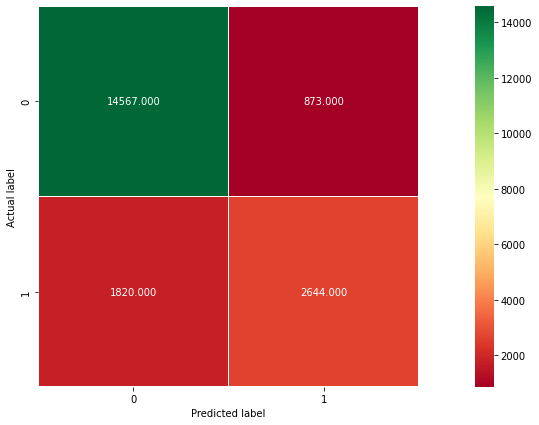

In [61]:
# Plotting the Confusion Matrix
plt.figure(figsize=(20,7))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'RdYlGn');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');

### Classification Report
A classification report is a performance evaluation metric in machine learning that provides a summary of the accuracy of a classifier on a test set. It provides several key metrics like:

- #### Precision

  Precision is the ratio of correctly predicted positive observations to the total predicted positive observations.

- #### Recall

  Recall is the ratio of correctly predicted positive observations to the all observations in actual class.

- #### F1-Score
  
  F1-Score is the Harmonic Mean between precision and recall. The range for F1-Score is [0, 1].

- #### Support 
  
  Support is the number of observations for each class.

- #### Accuracy

  Accuracy is the ratio of correctly predicted observation to the total observations.

- #### Macro Average 

  The average of the unweighted mean per label.

- #### Weighted Average

  The average weighted by the number of samples in each class.

Refer: https://www.statology.org/sklearn-classification-report/

In [62]:
# Generating a Classification Report based on the Actual and Predicted values
report = pd.DataFrame(classification_report(y_test, y_pred, output_dict = True))
report

,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.888936,0.751777,0.864701,0.820357,0.858175
recall,0.943459,0.592294,0.864701,0.767876,0.864701
f1-score,0.915386,0.662574,0.864701,0.788980,0.858686
support,15440.000000,4464.000000,0.864701,19904.000000,19904.000000


## Permutation Importance

Permutation importance is a technique used to evaluate the feature importance in a predictive model. It measures the decrease in model performance after a feature is randomly permuted. The idea behind this method is that if a feature is truly important for a model's predictions, then permuting the values of that feature should greatly decrease the accuracy of the model.

Refer: https://scikit-learn.org/stable/modules/permutation_importance.html

In [63]:
!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance # Library is required to calculate permutation importance for understanding important features

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 12.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 KB 12.5 MB/s eta 0:00:00
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=b3782b1d368a6ac7f11793ac5f1e06f50be88c607b2b80ca4191a19bf6dfd31a
  Stored in directory: /root/.cache/pip/wheels/85/ac/25/ffcd87ef8f9b1eec324fdf339359be71f22612459d8c75d89c
Successfully built eli5
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
notebook 5.7.16 requires jinja2<=3.0.0, but you have jinja2 3.1.2 which is incompatib

In [64]:
# Initialize the Permutation Importance model
perm = PermutationImportance(regressor, random_state=1).fit(X_test, y_test)

# Show the feature importances computed by the PermutationImportance model
eli5.show_weights(perm, feature_names = final_train_df.drop(columns=['RainTomorrow'], axis = 1).columns.tolist())

Weight,Feature
0.1214 ± 0.0032,Sunshine
0.0547 ± 0.0038,Humidity3pm
0.0428 ± 0.0027,Pressure3pm
0.0236 ± 0.0023,WindGustSpeed
0.0158 ± 0.0047,Cloud9am
0.0134 ± 0.0017,Pressure9am
0.0033 ± 0.0004,RainToday_Yes
0.0019 ± 0.0006,WindSpeed3pm
0.0013 ± 0.0008,WindSpeed9am
0.0010 ± 0.0002,Location_Witchcliffe


# Outliers Detection and Removal

Outliers are observations in a data set that are significantly different from the majority of other observations. They can have a major impact on statistical analyses and may lead to misleading results if not handled appropriately.

In some cases, they may represent legitimate values that need to be analyzed and understood in context, while in other cases, they may need to be removed or excluded from the analysis.

Refer: https://www.geeksforgeeks.org/machine-learning-outlier/

In [65]:
# Detecting outliers for each numeric variables
for i in numeric_df.columns:
  # Initialize the outliers list and set the threshold
  outliers = []
  threshold = 3 

  # Compute the mean and standard deviation of the current column
  mean=np.mean(numeric_df[i])
  std=np.std(numeric_df[i])

  for j in numeric_df[i]:
    # Compute the z-score of the current value
    z_score=(j-mean)/std

    # Check if the absolute z-score is greater than the threshold
    if np.abs(z_score)> threshold:
      outliers.append(j)
  # Print the columns and their outliers
  print(i)
  print(outliers, '\n')

MinTemp
[-8.0, -7.0, -7.0, -7.0, -8.5, -8.0, -7.1, -7.6, -7.5, -8.2, -7.2, -7.8, -7.0, -7.3, -7.0, 31.9, 33.9, 31.4, 31.4] 

MaxTemp
[44.8, 45.8, 46.4, 46.0, 45.2, 45.7, 46.6, 47.3, 47.3, 46.5, 44.9, 45.1, 46.9, 46.4, 45.3, 45.8, 45.5, -1.7, 0.0, 0.0, 0.1, -0.1, -2.2, -0.6, 0.6, 0.4, -0.7, -1.8, -0.2, 0.1, -1.3, 0.1, -0.6, -0.6, 1.6, 0.3, 1.2, 1.0, 0.5, 0.2, 0.9, -0.3, 0.6, -2.5, 1.4, 1.8, 1.0, -2.7, -1.0, 0.5, 1.6, -1.4, 0.1, -2.0, -1.3, 1.7, -0.9, -2.1, -1.5, -3.1, 0.9, 0.1, -0.8, 0.3, 1.0, -0.6, 1.0, 1.7, 1.1, -2.1, 1.4, -1.5, -1.2, -2.0, -0.1, -1.1, -1.5, 1.7, 0.2, 0.1, -0.3, 1.5, 0.0, 0.9, 1.7, 0.3, 0.6, 0.1, 1.8, 0.6, 0.0, -1.0, 0.0, 0.3, 0.8, 0.2, 1.6, 1.3, 1.3, -2.3, 1.0, -1.5, -1.5, -1.1, 0.5, 1.4, 1.2, 1.8, 1.1, 0.6, -2.2, -0.6, -3.7, -2.9, 0.3, -0.8, 0.5, 0.1, -0.4, 1.7, -3.8, 0.0, 1.6, 1.2, 0.9, -0.9, -1.7, -1.9, 0.9, -0.5, 1.2, -2.1, -0.3, 0.7, 1.3, 0.8, -0.3, -4.1, -1.4, 1.4, -0.7, 1.7, 1.0, -1.3, 1.5, 0.8, 1.0, -1.4, -0.2, -0.7, 0.0, -0.2, 1.6, -0.2, -0.2, -3.2, 0.0, -1.

In [66]:
# Function to detect and remove outliers
def detect_and_remove_outliers(numeric_df):
    for column_name in numeric_df.columns:

        # Initialize the outliers list and set the threshold
        outliers = []
        threshold = 3 # 3 Standard Deviations from the mean
        column = numeric_df[column_name]

        # Compute the mean and standard deviation of the current column
        mean = np.mean(column)
        std = np.std(column)

        for value in column:
          # Compute the z-score of the current value
            z_score = (value - mean) / std
            # Check if the absolute z-score is greater than the threshold
            if np.abs(z_score) > threshold:
                outliers.append(value)

        # Remove the outliers from the numeric dataframe
        numeric_df = numeric_df[~numeric_df[column_name].isin(outliers)]
    return numeric_df

# Apply the function to the numeric dataframe
df_without_outliers = detect_and_remove_outliers(numeric_df)
df_without_outliers.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,5.589730,5.143878,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,6.413997,16.9,21.8
1,7.4,25.1,0.0,4.924414,8.864299,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.457140,4.135976,17.2,24.3
2,17.5,32.3,1.0,5.589730,5.449981,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7
3,14.6,29.7,0.2,4.924414,8.658145,56.0,19.0,24.0,55.0,23.0,1009.2,1005.4,4.144165,4.149152,20.6,28.9
4,7.7,26.7,0.0,5.589730,8.660081,35.0,6.0,17.0,48.0,19.0,1013.4,1010.1,4.516682,4.231067,16.3,25.5


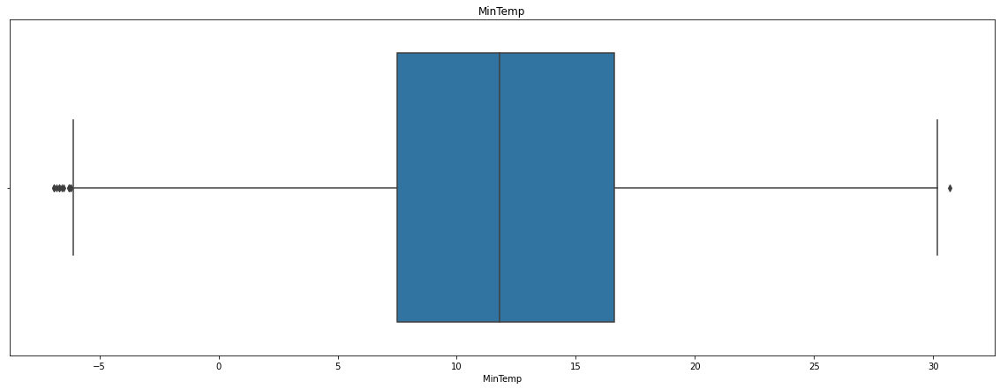

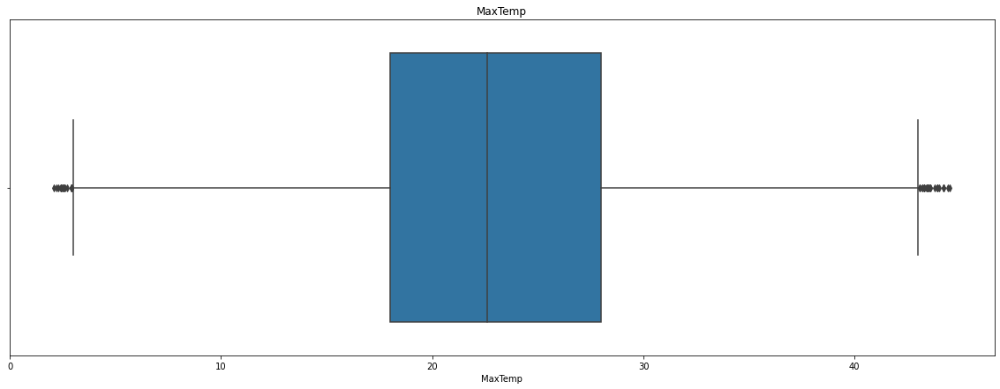

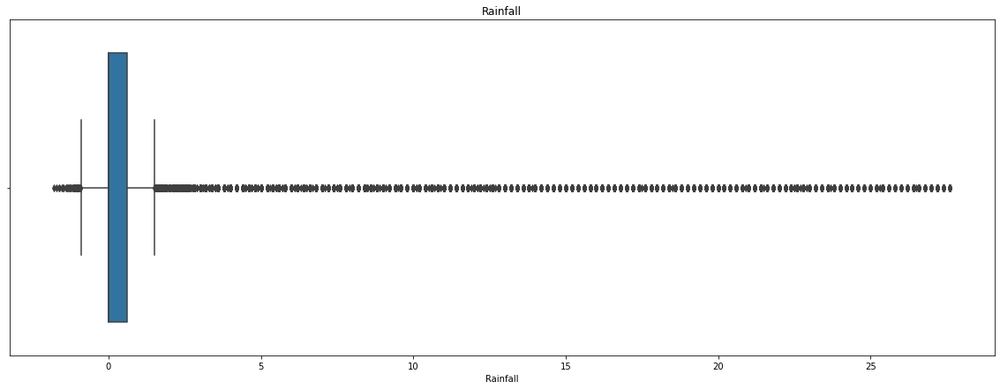

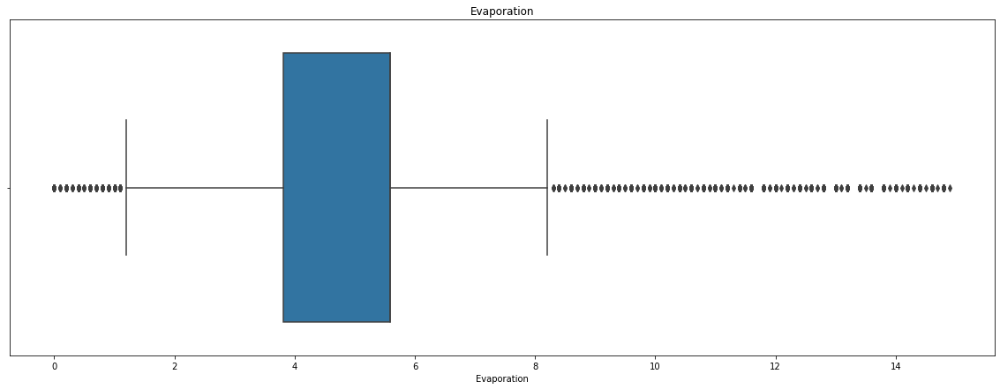

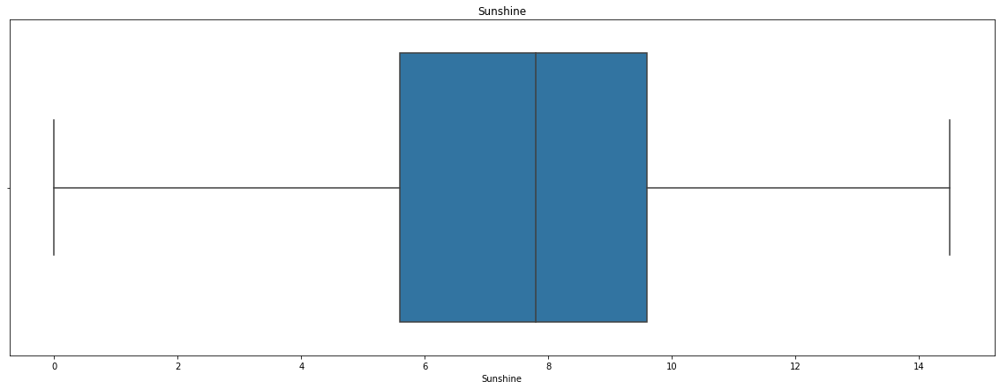

...

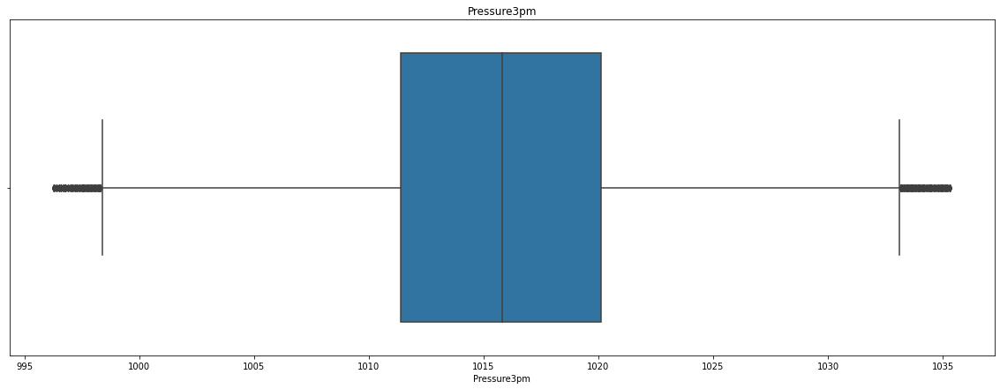

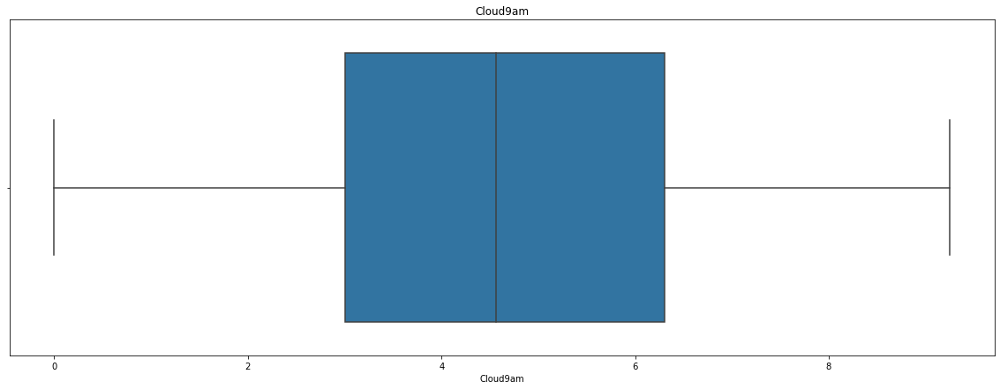

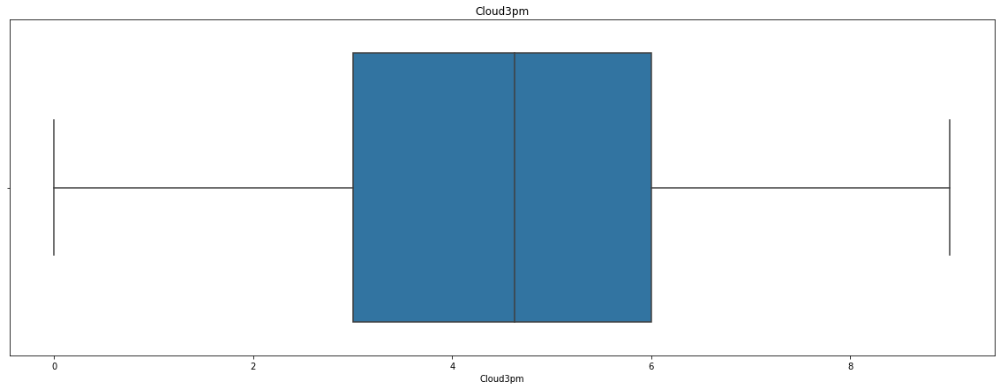

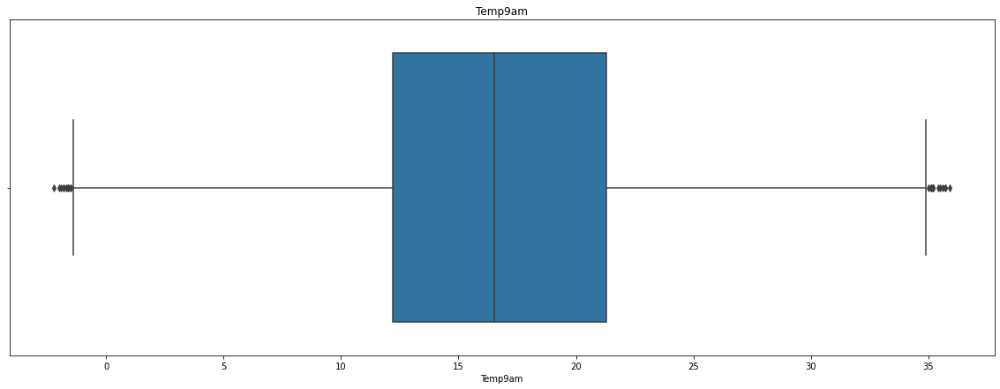

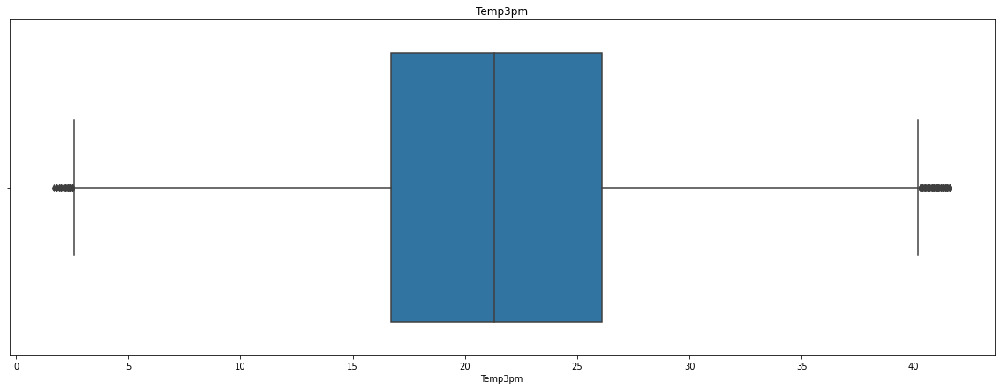

In [67]:
# Plotting distributions with respect to categories after removing outliers
for column_name in df_without_outliers.columns:
  plt.figure(figsize=(20,7))
  sns.boxplot(df_without_outliers[column_name])
  plt.title(column_name)
  plt.show()

In [68]:
# Remove the Outliers from the main DataFrame
col = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
final_train_df[col] = df_without_outliers[col]
final_train_df.dropna(inplace = True)

### Performing Regression after removing Outliers

In [69]:
# Split the data into features (X) and target (y)
X = final_train_df.drop(columns = ['RainTomorrow'], axis = 1).values
y = final_train_df['RainTomorrow'].values

In [70]:
X

array([[13.4, 22.9,  0.6, ...,  0. ,  1. ,  0. ],
       [ 7.4, 25.1,  0. , ...,  1. ,  1. ,  0. ],
       [17.5, 32.3,  1. , ...,  0. ,  1. ,  0. ],
       ...,
       [ 2.8, 23.4,  0. , ...,  0. ,  1. ,  0. ],
       [ 3.6, 25.3,  0. , ...,  0. ,  1. ,  0. ],
       [ 5.4, 26.9,  0. , ...,  0. ,  1. ,  0. ]])

In [71]:
y

array([0., 0., 0., ..., 0., 0., 0.])

In [72]:
# Splitting the Data set into 80% Training set and 20% Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [73]:
X_train

array([[21.5, 27.5, 13.2, ...,  0. ,  0. ,  1. ],
       [ 7.7, 19.4,  0.2, ...,  0. ,  1. ,  0. ],
       [ 9.7, 20.7,  0. , ...,  0. ,  1. ,  0. ],
       ...,
       [ 6.5, 13.5,  0. , ...,  0. ,  1. ,  0. ],
       [11.9, 22. ,  0.2, ...,  0. ,  1. ,  0. ],
       [14.6, 20.9,  0. , ...,  1. ,  1. ,  0. ]])

In [74]:
X_test

array([[17.        , 27.        ,  0.23877517, ...,  0.        ,
         1.        ,  0.        ],
       [15.1       , 25.6       ,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       [10.4       , 18.49756672,  0.8       , ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [13.        , 19.9       ,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       [ 5.7       , 13.8       , 19.6       , ...,  0.        ,
         0.        ,  1.        ],
       [20.4       , 23.6       ,  4.4       , ...,  0.        ,
         0.        ,  1.        ]])

In [75]:
y_train

array([1., 1., 0., ..., 0., 0., 0.])

In [76]:
y_test

array([0., 0., 0., ..., 0., 1., 1.])

In [77]:
# Fit MinMaxScaler on the training data
scaler = MinMaxScaler()
scaler.fit(X_train)

# Transform both the training and test data
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [78]:
X_train

array([[0.75531915, 0.5971564 , 0.50991119, ..., 0.        , 0.        ,
        1.        ],
       [0.38829787, 0.40521327, 0.06746991, ..., 0.        , 1.        ,
        0.        ],
       [0.44148936, 0.43601896, 0.06066312, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.35638298, 0.26540284, 0.06066312, ..., 0.        , 1.        ,
        0.        ],
       [0.5       , 0.46682464, 0.06746991, ..., 0.        , 1.        ,
        0.        ],
       [0.57180851, 0.44075829, 0.06066312, ..., 1.        , 1.        ,
        0.        ]])

In [79]:
X_test

array([[0.6356383 , 0.58530806, 0.06878958, ..., 0.        , 1.        ,
        0.        ],
       [0.58510638, 0.5521327 , 0.06066312, ..., 0.        , 1.        ,
        0.        ],
       [0.46010638, 0.3838286 , 0.08789028, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.52925532, 0.41706161, 0.06066312, ..., 0.        , 1.        ,
        0.        ],
       [0.33510638, 0.27251185, 0.72772844, ..., 0.        , 0.        ,
        1.        ],
       [0.72606383, 0.50473934, 0.21041248, ..., 0.        , 0.        ,
        1.        ]])

In [80]:
# Train the logistic regression model
logistic_regression = LogisticRegression()
logistic_regression.fit(X_train, y_train)

# Use the trained model to make predictions
y_pred = logistic_regression.predict(X_test)

In [81]:
y_pred

array([0., 0., 0., ..., 0., 1., 1.])

In [82]:
# Calculating Train and Test Score
train_score = regressor.score(X_train , y_train)
test_score = regressor.score(X_test , y_test)
print("Train Score: ", round(train_score, 5))
print("Test Score: ", round(test_score,5))

Train Score:  0.70758
Test Score:  0.71242


In [83]:
# Assessing the Prediction values
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R-Squared:", r2)

Mean Absolute Error: 0.1334013313291819
Mean Squared Error: 0.1334013313291819
R-Squared: 0.19651416838991298


In [84]:
# Generating a Confusion Matrix using the actual and predicted values
cm = confusion_matrix(y_test, y_pred)
cm

array([[13984,   728],
       [ 1757,  2159]])

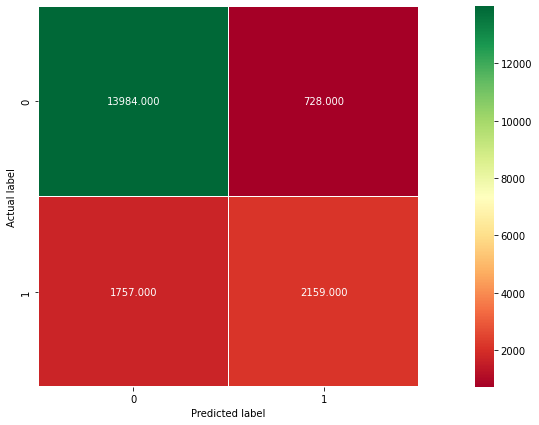

In [85]:
# Plotting the Confusion Matrix
plt.figure(figsize=(20,7))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'RdYlGn');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');

In [86]:
# Generating a Classification Report based on the Actual and Predicted values
report = pd.DataFrame(classification_report(y_test, y_pred, output_dict = True))
report

,0.0,1.0,accuracy,macro avg,weighted avg
precision,0.888381,0.747835,0.866599,0.818108,0.858835
recall,0.950517,0.551328,0.866599,0.750922,0.866599
f1-score,0.918399,0.634720,0.866599,0.776559,0.858764
support,14712.000000,3916.000000,0.866599,18628.000000,18628.000000


## Feature Importance of Numeric Variables

In [87]:
# Correlation of numeric variables
numeric_df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.737068,0.102687,0.361921,0.104276,0.176808,0.177222,0.172374,-0.237063,-0.003574,-0.467756,-0.480224,-0.006370,-0.031926,0.898412,0.701883
MaxTemp,0.737068,1.000000,-0.073905,0.448774,0.449927,0.071148,0.018670,0.050388,-0.505771,-0.507682,-0.356073,-0.446199,-0.310462,-0.291512,0.880843,0.969634
Rainfall,0.102687,-0.073905,1.000000,-0.037744,-0.252596,0.127484,0.087506,0.061276,0.220713,0.248441,-0.157408,-0.118417,0.216456,0.180504,0.011441,-0.077964
Evaporation,0.361921,0.448774,-0.037744,1.000000,0.293323,0.152061,0.141328,0.091817,-0.379907,-0.290090,-0.210027,-0.230342,-0.167313,-0.164023,0.424827,0.435236
Sunshine,0.104276,0.449927,-0.252596,0.293323,1.000000,-0.018707,0.029126,0.045374,-0.536223,-0.595609,0.021997,-0.030858,-0.736390,-0.679824,0.310347,0.463204
WindGustSpeed,0.176808,0.071148,0.127484,0.152061,-0.018707,1.000000,0.615645,0.697999,-0.220647,-0.031052,-0.448497,-0.401734,0.047110,0.061832,0.154142,0.036110
WindSpeed9am,0.177222,0.018670,0.087506,0.141328,0.029126,0.615645,1.000000,0.520957,-0.271676,-0.030131,-0.232216,-0.177319,0.009873,0.017907,0.132091,0.007841
WindSpeed3pm,0.172374,0.050388,0.061276,0.091817,0.045374,0.697999,0.520957,1.000000,-0.146324,0.016070,-0.308961,-0.268447,0.025049,0.001414,0.161560,0.028268
Humidity9am,-0.237063,-0.505771,0.220713,-0.379907,-0.536223,-0.220647,-0.271676,-0.146324,1.000000,0.662730,0.158466,0.201958,0.398842,0.365611,-0.472930,-0.497536
Humidity3pm,-0.003574,-0.507682,0.248441,-0.290090,-0.595609,-0.031052,-0.030131,0.016070,0.662730,1.000000,0.000986,0.075017,0.441411,0.465913,-0.225302,-0.556914


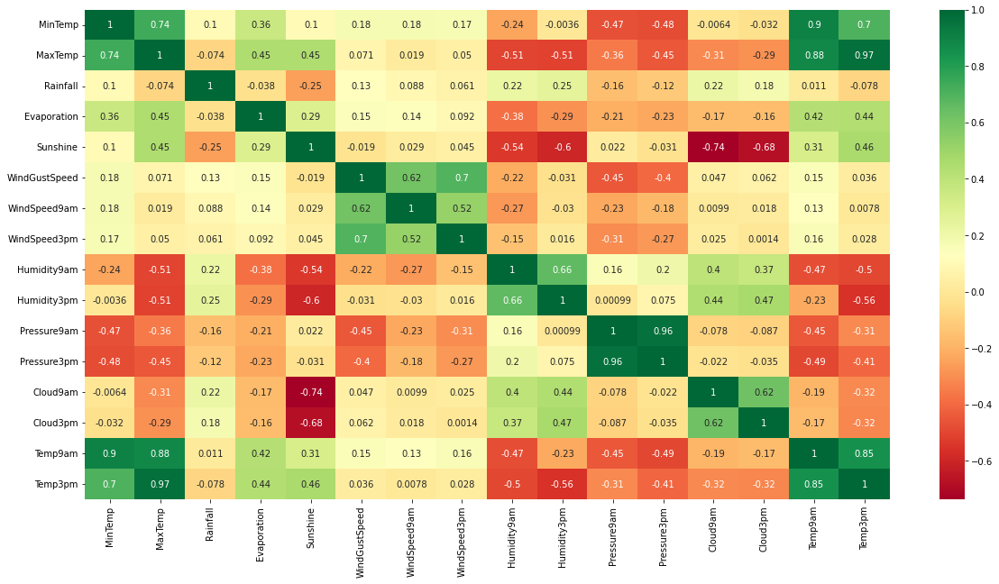

In [88]:
# Heat Map of Numeric Variables
plt.figure(figsize = (20,10))
sns.heatmap(numeric_df.corr() , annot = True, cmap = "RdYlGn")

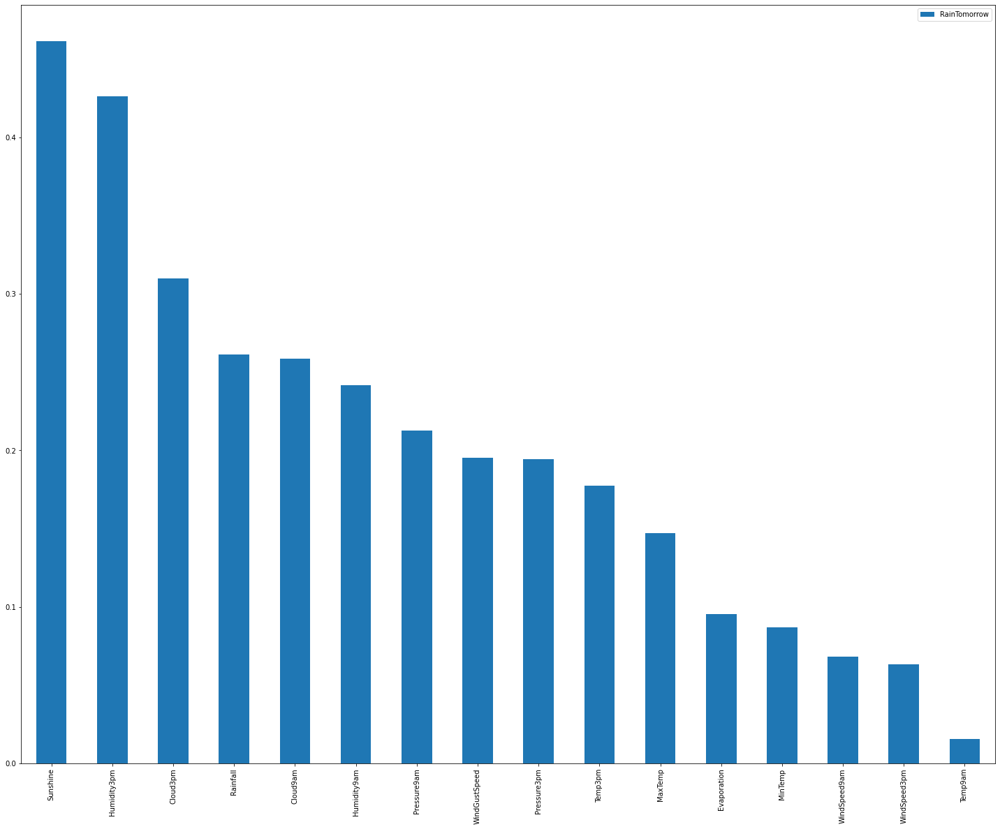

In [89]:
# Ranking numeric variables based on correlation
new_df = final_train_df[['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainTomorrow']] 
pd.DataFrame(abs(new_df.corr()['RainTomorrow'].drop('RainTomorrow')).sort_values(ascending=False)).plot.bar()

## Questions:

### 1. What are the data types (Only numeric and categorical)?

#### Numeric Variables
- MinTemp
- MaxTemp
- Rainfall
- Evaporation
- Sunshine
- WindGustSpeed
- WindSpeed9am
- WindSpeed3pm
- Humidity9am
- Humidity3pm
- Pressure9am
- Pressure3pm
- Cloud9am
- Cloud3pm
- Temp9am
- Temp3pm

#### Categorical Variables
- Location
- WindGustDir
- WindDir9am
- WindDir3pm
- RainToday

### 2. Are there missing values?

Yes. There are missing values in both the numeric and categorical values which will need to be imputed for further processing.

### 3.  What are the likely distributions of the numeric variables?

As per the <a href = 'https://colab.research.google.com/drive/1mSsIvw-DRlwnNxGX4CtEl3AAstPlSKaa#scrollTo=c33f83f9&line=7&uniqifier=1'> QQ Plot</a> and <a href = 'https://colab.research.google.com/drive/1mSsIvw-DRlwnNxGX4CtEl3AAstPlSKaa#scrollTo=2Xr_btgKSC1d&line=7&uniqifier=1'> Histogram</a>, majority of the columns are normally distributed except for Rainfall which contains a lot of outliers which we will remove in the later stage.


### 4. Which independent variables are useful to predict a target (dependent variable)?

The independent variables most useful to predict a target are as follows:
1. Sunshine
2. Humidity3pm
3. Pressure3pm
4. WindGustSpeed
5. Cloud9am
6. Pressure9am
7. WindGustSpeed
8. Pressure3pm
9. Temp3pm
10. MaxTemp

This is derived from observing the Correlation, Heat Map, Ranking of Correlated data and Permutation Importance calculated from the data set.



### 5. Which independent variables have missing data? How much?

In [90]:
# Function to find total and percentage of missing values

total = train_df.isnull().sum().sort_values(ascending = False)
percent = (train_df.isnull().sum()/train_df.isnull().count()*100).sort_values(ascending = False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
print(missing_data)

               Total    Percent
Sunshine       47317  47.547128
Evaporation    42531  42.737851
Cloud3pm       40002  40.196551
Cloud9am       37572  37.754733
Pressure9am     9748   9.795410
Pressure3pm     9736   9.783351
WindGustSpeed   6480   6.511516
Humidity3pm     2506   2.518188
Temp3pm         1904   1.913260
WindSpeed3pm    1835   1.843925
Humidity9am     1233   1.238997
Rainfall         979   0.983761
WindSpeed9am     935   0.939547
Temp9am          614   0.616986
MinTemp          443   0.445155
MaxTemp          230   0.231119
RainTomorrow       0   0.000000


### 6. Do the training and test sets have the same data?

Yes, the Training and Test sets have been generated by splitting the main Data set in 80-20 distribution. Therefore, both of them follow the same trends and data distribution.

### 7. Is the predictor variables independent of all the other predictor variables?

No, the predictor variables are not independent of other predictor variables. There is high multicollinearity among multiple variables with the correlation values as high as 0.98.

### 8. Which predictor variables are the most important?

The predictor variables that are most important for predicting the target variables are ranked in priority as follows:

1. Sunshine
2. Humidity3pm
3. Pressure3pm
4. WindGustSpeed
5. Cloud9am
6. Pressure9am

### 9. Do the ranges of the predictor variables make sense?
- Predictor variables like MinTemp, MaxTemp, Sunshine, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Temp9am and Temp3pm make sense as they're normally distributed within a wide range
- However, Cloud9am and Cloud3pm contain a very short range of values between 0 to 9 which is an indicator of limited variability in the data which might affect the accuracy and interpretability of the results of a predictive model
- Evaporation is right skewed which indicates that the evaporation rate was lower than expected
- Finally, variables like WindGustSpeed, WindSpeed9am and WindSpeed3pm are also right skewed meaning Wind Speed were far lower in our data set than the expected values

### 10. What are the distributions of the predictor variables?

Most of the numerical variables are normally distributed except for a few which are right skewed. This can be observed in the <a href = 'https://colab.research.google.com/drive/1mSsIvw-DRlwnNxGX4CtEl3AAstPlSKaa#scrollTo=jvXI0LXl8Nu5&line=11&uniqifier=1'>histogram</a> where the categorical variables follow Bernoulli distribution.

### 11. Remove outliers and keep outliers (does if have an effect of the final predictive model)?

- Upon comparing the accuracy of the predictions of data sets with and without outliers, we realized that test and train score decreased after removing outliers.

- Outliers can contain important information that might be relevant for making accurate predictions. If these outliers are removed, the model may miss out on important information, leading to decreased accuracy in predictions.

### 12. Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

### Results of Simple Imputation using Median
##### 1% Missing Values:

- Mean Absolute Error for 1.0% of missing values: 0.0065

- Mean Squared Error for 1.0% of missing values: 0.07224

- R-Squared for 1.0% of missing values: 0.9935

- Bias:  0.00045

- Percent Error:  1.38151

- Variance:  0.07178 

##### 5% Missing Values:
- Mean Absolute Error for 5.0% of missing values: 0.03341

- Mean Squared Error for 5.0% of missing values: 0.37226

- R-Squared for 5.0% of missing values: 0.96704

- Bias:  0.01141

- Percent Error:  6.88437

- Variance:  0.36084 

##### 10% Missing Values:

- Mean Absolute Error for 10.0% of missing values: 0.06888

- Mean Squared Error for 10.0% of missing values: 0.76888

- R-Squared for 10.0% of missing values: 0.93071

- Bias:  0.04715

- Percent Error:  14.65547

- Variance:  0.72172 

### Results of Simple Imputation using Most Frequent

##### 1% Missing Values:
- Mean Absolute Error for 1.0% of missing values: 0.00864
- Mean Squared Error for 1.0% of missing values: 0.12251
- R-Squared for 1.0% of missing values: 0.99066
- Bias:  0.00073
- Percent Error:  0.91127
- Variance:  0.12178 

##### 5% Missing Values:
- Mean Absolute Error for 5.0% of missing values: 0.04312
- Mean Squared Error for 5.0% of missing values: 0.61253
- R-Squared for 5.0% of missing values: 0.95405
- Bias:  0.01852
- Percent Error:  4.49307
- Variance:  0.59402 

##### 10% Missing Values:
- Mean Absolute Error for 10.0% of missing values: 0.08687
- Mean Squared Error for 10.0% of missing values: 1.2384
- R-Squared for 10.0% of missing values: 0.90816
- Bias:  0.07505
- Percent Error:  8.93892
- Variance:  1.16335 

### Results of MICE Imputation

##### 1% Missing Values:
- Mean Absolute Error for 1.0% of missing values: 0.0065
- Mean Squared Error for 1.0% of missing values: 0.07224
- R-Squared for 1.0% of missing values: 0.9935
- Bias:  0.00045
- Percent Error:  1.38151
- Variance:  0.07178 

##### 5% Missing Values:
- Mean Absolute Error for 5.0% of missing values: 0.03341
- Mean Squared Error for 5.0% of missing values: 0.37226
- R-Squared for 5.0% of missing values: 0.96704
- Bias:  0.01141
- Percent Error:  6.88437
- Variance:  0.36084 

##### 10% Missing Values:
- Mean Absolute Error for 10.0% of missing values: 0.06888
- Mean Squared Error for 10.0% of missing values: 0.76888
- R-Squared for 10.0% of missing values: 0.93071
- Bias:  0.04715
- Percent Error:  14.65547
- Variance:  0.72172 

## Conclusion
We applied logistic regression on our classification model of Australia weather data to evaluate the impact of several predictor variables on the target variable. After preprocessing and cleaning the data, the relevant features were selected and the model was trained and tested on the data. The results of the model showed a high level of accuracy in predicting the target variable based on the predictor variables. The model also provided insight into the most significant predictors affecting the target variable.

## References

We have referred the following links and websites to understand the machine learning concepts:

1. GeeksforGeeks
2. statsmodels
3. towardsdatascience
4. scikitlearn documentation
5. analyticsvidhya
6. StatQuest with Josh Starmer
7. statology
8. eli5 documentation

Specific links have been provided within the notebook for detailed reference. We referred matplotlib and seaborn documentation for preparing data visualizations. Rest of the code is written individually.

MIT License

Copyright (c) 2022 Draconian10

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.